# Roget's Thesaurus (Clustering)

> Konstantinos Mpouros <br>
> Github: https://github.com/konstantinosmpouros <br>
> Year: 2024 <br>

## 1. About the notebook
---

The purpose of this notebook is to performe a part of the hole project (<b>Roget's Thesaurus in the 21st Century</b>) which is the clustering of the embeddings we created in notebook <b>Roget's Data and Embeddings</b> and a similarity check between the clusters we will make and the classes the Roget's Classification project has. The clustering will be contacted in 2 parts, Class Clustering and Section Clustering. <br>

> 1. First the class clustering will be done be conduct clustering in the embeddings to create 6 main classes and the check if this clusters are similar to the classes that roget created. <br>
> 2. Second the section clustering will be done upon the class clustering, so we will use are section column the manual columns we created in the <b>Roget's Data and Embeddings</b> called section that contains the second tier classes of roget's classification. In order to do this clustering we will try to check the number of sections each class have and then we will assign in the class clusters one of these numbers that matches the most according to the silhouetter score they will have. And in the end we must also see if the section clusters we created have any type of similarity with the sections that roget's classification contains.

**Important info:** The structure of the notebook is the following. The main part of the code is been writen in functions in order to be easier to see the results and not have a headache seening them all together. The main method that implements the clustering, the cosine similarity and the comparison are writen in the ***helper_function.py***.

## 2. Libraries
---

In [1]:
# Data Loading and Manipulation
import pandas as pd
import numpy as np
import re

# Data Normialization and Metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity

# Visualization
from matplotlib import pyplot as plt
import seaborn as sns

# Clustering and Dimensionality reduction
from sklearn.cluster import BisectingKMeans as BKMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from scipy.optimize import linear_sum_assignment

In [2]:
sns.set_style('whitegrid')
pd.set_option('display.max_columns', None)

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

## 3. Load Embeddings and PCA
---

### Data Loading

> Loading the data we will need (Embeddings and roget's classification) in order to perform the clustering

In [3]:
rogert_words = pd.read_csv("Dataset/Roget's_Words.csv")
print(rogert_words.shape)
rogert_words.head()

(88353, 6)


,Class,Division,Primary_Section,Sub_Section,Word,Section
0,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",existence,SECTION I. EXISTENCE
1,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",being,SECTION I. EXISTENCE
2,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",entity,SECTION I. EXISTENCE
3,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",subsistence,SECTION I. EXISTENCE
4,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",reality,SECTION I. EXISTENCE


In [4]:
sentence_tranformer_embeddings = pd.read_json('Embeddings/sentence_tranformer_embeddings.json')
print(sentence_tranformer_embeddings.shape)
sentence_tranformer_embeddings.head()

(88353, 1)


,Embeddings
0,"[-0.06880877170000001, 0.0015575370000000001, ..."
1,"[0.0024004122000000003, 0.020551782100000002, ..."
2,"[-0.0097784037, -3.9502e-05, -0.01282439660000..."
3,"[-0.012498525, 0.0810882673, -0.0504169427, 0...."
4,"[-0.0132661257, 0.0121876495, -0.0619583502000..."


In [5]:
sentence_tranformer_embeddings = pd.merge(sentence_tranformer_embeddings,
                                          rogert_words[['Class', 'Section']],
                                          left_index=True,
                                          right_index=True,
                                          how='inner'
                                         )
print(sentence_tranformer_embeddings.shape)
sentence_tranformer_embeddings.head()

(88353, 3)


,Embeddings,Class,Section
0,"[-0.06880877170000001, 0.0015575370000000001, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE
1,"[0.0024004122000000003, 0.020551782100000002, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE
2,"[-0.0097784037, -3.9502e-05, -0.01282439660000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE
3,"[-0.012498525, 0.0810882673, -0.0504169427, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE
4,"[-0.0132661257, 0.0121876495, -0.0619583502000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE


In [6]:
use_embeddings = pd.read_json('Embeddings/universal_sentence_encoder_embeddings.json')
print(use_embeddings.shape)
use_embeddings.head()

(88353, 1)


,Embeddings
0,"[-0.0396379605, -0.042999919500000004, -0.0274..."
1,"[-0.0382796377, -0.0570409745, 0.0563224480000..."
2,"[-0.040613506, 0.013880508000000001, -0.027027..."
3,"[-0.0177038833, -0.0793429762, -0.018696246700..."
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0...."


In [7]:
use_embeddings = pd.merge(use_embeddings,
                          rogert_words[['Class', 'Section']],
                          left_index=True,
                          right_index=True,
                          how='inner'
                          )
print(use_embeddings.shape)
use_embeddings.head()

(88353, 3)


,Embeddings,Class,Section
0,"[-0.0396379605, -0.042999919500000004, -0.0274...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE
1,"[-0.0382796377, -0.0570409745, 0.0563224480000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE
2,"[-0.040613506, 0.013880508000000001, -0.027027...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE
3,"[-0.0177038833, -0.0793429762, -0.018696246700...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE


### PCA

> Check if the embeddings are well explained in less dimensions and if in there visualizations patterns and groups seems to appear. <br>
> Lets keep in mind the plots that we will show here cause the plots will be according to roget classes and section. We will show visualization for the clusters too and its an easy way to see the differences between these two.

In [8]:
# This methos take as input a list of numbers and a dataframe that contains the embeddings.
# Its purpose is to take the embeddings and check the variance explanation with each number in the list as a number of components in the PCA.
# The output will be a plot that will show us in a line plot the explanation that each number had in the embeddings.

def pca_explanation(numbers_list, df):
    explained_variance = list()
    for i in numbers_list:
        pca = PCA(n_components=i, random_state=33)
        pca.fit(list(df.Embeddings.values))
        explained_variance.append(pca.explained_variance_ratio_.sum())

    explained_variance = pd.DataFrame(explained_variance)
    explained_variance['index'] = numbers_list
    explained_variance.set_index('index', inplace=True)
    
    sns.lineplot(x=explained_variance.index, y=explained_variance[0], color='lightblue')
    plt.xlabel('Number of Components')
    plt.ylabel('Explained Variance Ratio')
    plt.ylim([0, 1])
    plt.tight_layout()
    plt.show()

#### Sentence Transformer

In [9]:
pca2 = PCA(n_components=2, random_state=33)
embeddings_pca = pca2.fit_transform(list(sentence_tranformer_embeddings.Embeddings.values))
embeddings_pca

array([[ 0.10959501,  0.16928946],
       [ 0.18924876,  0.02237705],
       [-0.0241036 , -0.00362121],
       ...,
       [-0.05027556,  0.20511444],
       [-0.10208539,  0.13552458],
       [ 0.11740743,  0.17448132]])

In [10]:
print(pca2.explained_variance_ratio_)
print(pca2.explained_variance_ratio_.sum())

[0.02265051 0.02105756]
0.04370806807404531


In [11]:
embeddings_pca = pd.DataFrame(embeddings_pca)
embeddings_pca.head()

,0,1
0,0.109595,0.169289
1,0.189249,0.022377
2,-0.024104,-0.003621
3,-0.011507,0.118210
4,0.218285,0.019750


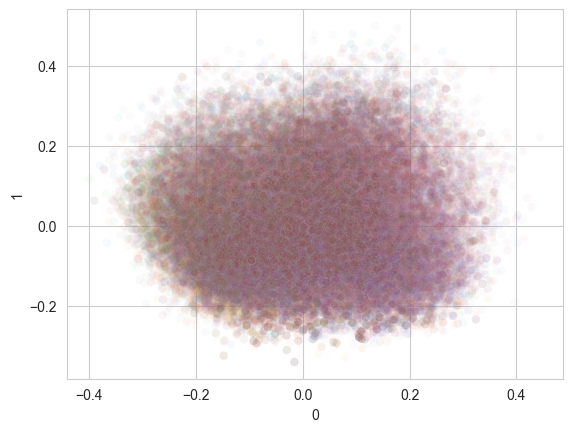

In [12]:
sns.scatterplot(x=embeddings_pca[0], y=embeddings_pca[1], hue=sentence_tranformer_embeddings.Class, alpha=0.03)
plt.legend().remove()
plt.show()

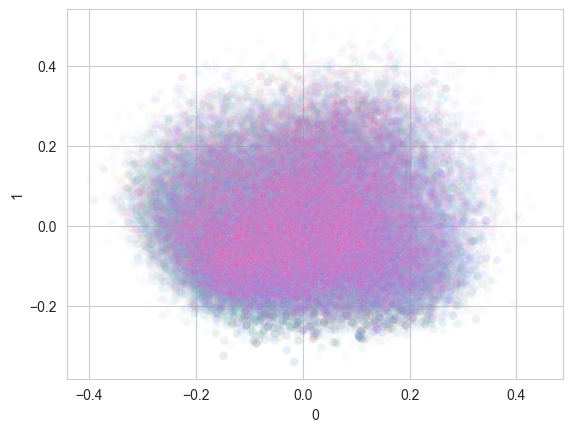

In [13]:
sns.scatterplot(x=embeddings_pca[0], y=embeddings_pca[1], hue=sentence_tranformer_embeddings.Section, alpha=0.03)
plt.legend().remove()
plt.show()

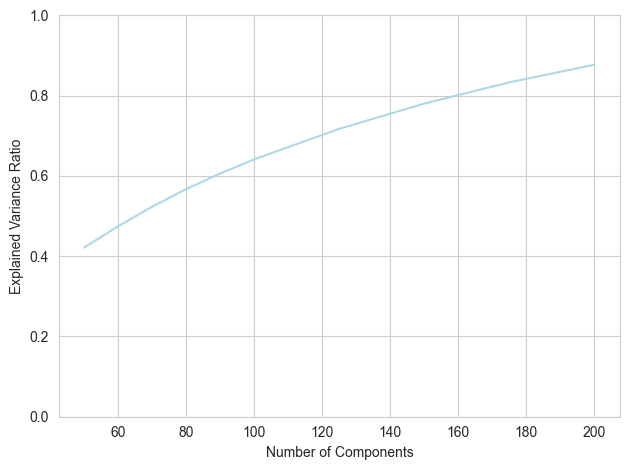

In [14]:
pca_explanation([50, 60, 70, 80, 90, 100, 125, 150, 175, 200], sentence_tranformer_embeddings)

In [15]:
pca200 = PCA(n_components=200, random_state=33)
sentence_tranformer_pca_embeddings = pd.DataFrame(pca200.fit_transform(list(sentence_tranformer_embeddings.Embeddings.values)))
sentence_tranformer_pca_embeddings

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199
0,0.109517,0.169621,-0.125610,-0.049148,-0.008650,0.146073,0.018550,-0.148769,0.136156,0.084662,-0.043477,-0.026051,-0.103729,-0.032199,0.050485,-0.037009,0.093778,-0.120722,0.177520,-0.024833,-0.065306,-0.085278,-0.016845,0.025918,0.012059,-0.130327,0.122570,-0.019141,-0.042123,0.061849,-0.004372,0.022214,0.055277,0.142145,0.030437,0.069443,-0.007786,-0.071002,-0.039617,-0.043945,-0.159023,0.031948,0.057473,0.012390,0.105894,0.026385,0.001183,-0.021259,0.083143,0.013398,0.103156,-0.010236,-0.015271,0.180638,-0.024357,0.081258,-0.105281,-0.011779,0.038665,-0.061398,-0.016498,-0.034428,0.035588,-0.000337,0.031640,0.029832,-0.143807,-0.135607,-0.044065,0.001020,-0.040384,0.011719,-0.068853,0.046264,0.001321,0.050116,-0.031874,0.001898,-0.011194,-0.024278,-0.007932,-0.014645,0.007827,0.028662,0.004786,-0.069779,0.035357,0.035713,0.014842,0.051984,0.011322,0.036661,0.010491,-0.054337,-0.165270,-0.040186,0.121125,0.010133,-0.041146,0.048156,-0.042953,0.063199,0.033971,0.048472,0.006869,0.051774,-0.020407,0.008751,0.091652,0.067179,-0.101066,0.055451,0.005229,-0.001931,0.007922,-0.016045,-0.064500,0.033809,0.023669,0.049708,-0.027199,0.023942,0.046762,-0.010195,-0.004320,0.030237,-0.003717,0.008907,0.017731,-0.030130,-0.009512,-0.037515,0.010236,0.037889,-0.074505,-0.066812,0.013409,-0.039471,0.006343,-0.020888,-0.027966,-0.042277,-0.022648,-0.011365,-0.070773,-0.058375,0.028536,-0.042274,-0.014713,-0.006704,-0.040800,0.084413,-0.033230,0.007643,0.004632,-0.017961,-0.012866,0.083562,0.053914,0.023013,-0.045389,0.021418,-0.014420,0.019199,-0.022335,0.028170,0.062698,-0.043660,-0.000041,-0.058554,-0.014243,0.030310,0.073286,-0.021117,-0.057089,-0.009331,-0.013587,-0.029173,-0.000321,0.029799,0.064695,0.055245,0.054591,0.014177,-0.092441,0.032765,0.028050,0.009280,-0.037628,-0.010744,-0.020947,0.005932,0.006474,-0.070484,0.036024,-0.046898,0.059075,-0.035117,-0.047295,-0.017545
1,0.189261,0.022333,0.117537,-0.191006,0.046414,0.227674,0.151365,-0.033845,-0.021997,-0.176323,0.077595,-0.039653,0.008801,0.051015,0.013738,-0.007471,0.072435,-0.016190,0.046813,-0.005297,0.000016,0.087118,-0.041068,-0.055711,-0.051332,-0.070345,0.067845,0.135930,0.054190,-0.052004,0.069458,-0.048252,0.038289,0.063235,0.040878,0.127881,-0.070470,-0.057171,-0.050110,-0.067048,0.012688,0.134410,-0.008881,-0.078731,-0.046589,0.050980,-0.014519,-0.012399,0.005902,0.101070,-0.004234,0.064760,-0.013063,0.048326,-0.117209,-0.026635,0.022415,-0.067889,0.002400,0.056515,-0.070914,-0.058901,-0.011828,-0.069763,-0.033024,-0.037602,-0.034838,-0.002822,-0.002591,-0.053987,-0.020455,-0.000246,-0.038523,-0.007522,-0.160043,-0.017555,-0.001136,-0.003001,-0.011516,-0.049628,0.009990,0.035467,-0.065765,-0.081073,-0.013611,0.048359,-0.046805,0.015030,0.105879,0.077893,0.000914,0.012092,-0.037766,-0.020645,-0.072325,-0.107434,0.046378,-0.032774,-0.085359,0.028584,0.033801,0.021000,-0.111881,0.037577,0.038019,-0.034155,0.023644,-0.028846,0.000806,0.038872,0.023370,0.012944,-0.002175,-0.088788,0.046184,0.025167,-0.078273,0.078255,-0.068878,0.065560,-0.075912,-0.014554,0.033903,0.013691,-0.014244,0.042162,-0.033564,0.002113,-0.003604,0.021931,-0.046828,-0.043780,-0.013564,0.038866,-0.011915,-0.077402,-0.031080,-0.102499,-0.042636,0.021197,0.055102,0.092914,-0.000043,0.027324,0.085979,0.029980,0.043127,0.0

In [16]:
pca200.explained_variance_ratio_.sum()

0.877295269863716

> In order to hit a high score in the variance explanation of the sentence transformer's embeddings we need to get close to the actuall dimensions that the embeddings had.

#### Universal Sentence Encoder

In [17]:
embeddings_pca = pca2.fit_transform(list(use_embeddings.Embeddings.values))
embeddings_pca

array([[-0.06893581,  0.10279901],
       [-0.11345162,  0.48438715],
       [-0.11053499,  0.11642706],
       ...,
       [-0.17229759, -0.0569189 ],
       [ 0.01606783,  0.02155608],
       [ 0.24451903, -0.1182965 ]])

In [18]:
print(pca2.explained_variance_ratio_)
print(pca2.explained_variance_ratio_.sum())

[0.05579261 0.03460926]
0.09040187087468993


In [19]:
embeddings_pca = pd.DataFrame(embeddings_pca)
embeddings_pca.head()

,0,1
0,-0.068936,0.102799
1,-0.113452,0.484387
2,-0.110535,0.116427
3,-0.128264,0.036500
4,-0.002121,0.131027


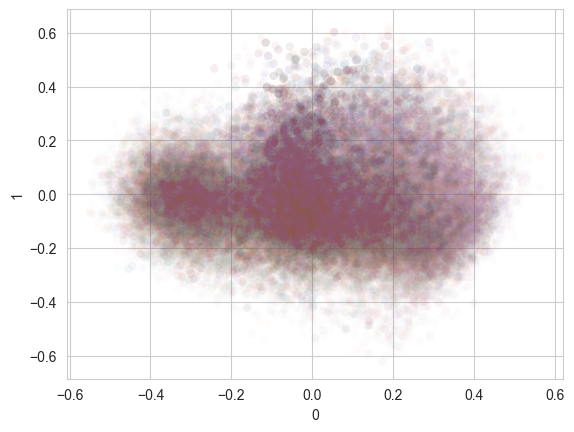

In [20]:
sns.scatterplot(x=embeddings_pca[0], y=embeddings_pca[1], hue=use_embeddings.Class, alpha=0.015)
plt.legend().remove()
plt.show()

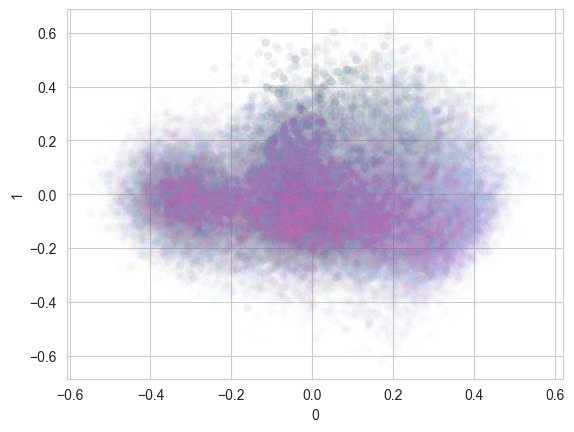

In [21]:
sns.scatterplot(x=embeddings_pca[0], y=embeddings_pca[1], hue=use_embeddings.Section, alpha=0.015)
plt.legend().remove()
plt.show()

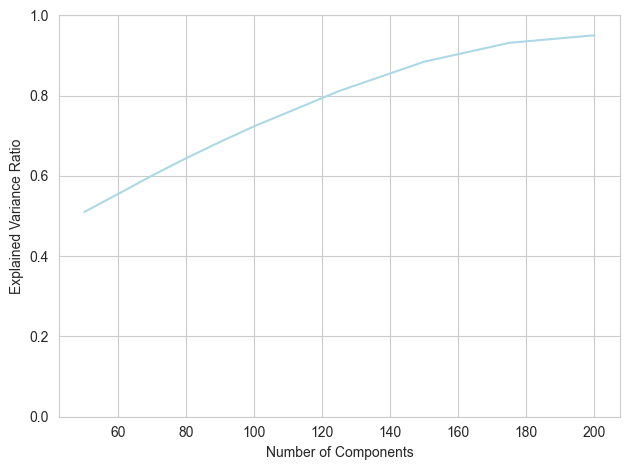

In [22]:
pca_explanation([50, 60, 70, 80, 90, 100, 125, 150, 175, 200], use_embeddings)

In [23]:
use_pca_embeddings = pd.DataFrame(pca200.fit_transform(list(use_embeddings.Embeddings.values)))
use_pca_embeddings

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199
0,-0.068936,0.102778,0.313130,0.118983,-0.027085,-0.073182,0.038236,-0.009341,0.168092,-0.102757,-0.035243,-0.048175,-0.150138,-0.036603,-0.241818,0.156546,-0.182210,-0.022647,-0.026557,-0.085415,0.038522,0.051176,-0.079025,0.084621,0.012615,0.147484,-0.001849,-0.119666,0.005914,0.020609,0.071170,-0.052488,0.007632,0.094086,-0.022489,-0.047169,0.094817,0.062783,-0.097889,-0.002364,-0.023744,0.021967,0.033572,-0.095135,-0.003148,-0.093470,-0.008141,-0.035757,0.075438,0.097238,0.122112,0.020044,0.045204,-0.011700,0.027624,-0.021585,0.019216,0.047412,0.074211,-0.071565,-0.021724,-0.026195,0.112139,-0.005651,0.027607,0.064160,0.188925,0.068022,0.017150,-0.002943,-0.066088,0.012651,-0.046519,0.015326,-0.006597,0.038059,0.004701,-0.013001,0.030972,0.028651,-0.019774,-0.027112,-0.026548,0.027089,-0.037350,0.024898,0.001226,-0.060649,-0.105188,-0.000212,0.048921,-0.010340,0.034028,-0.078936,0.004017,0.003509,-0.018387,-0.007744,0.035561,-0.007336,-0.053301,-0.006720,0.010079,-0.033117,0.043280,-0.023567,0.052917,-0.038225,-0.000861,-0.025375,-0.041278,0.025336,-0.055119,0.041926,0.102273,0.062415,-0.018583,0.025086,0.037268,-0.025131,0.033339,0.030723,0.012020,0.041068,0.073843,-0.000404,-0.019967,-0.041030,0.029091,-0.037776,0.126261,0.033507,0.064691,-0.075291,-0.024750,0.039949,0.016148,0.016815,0.007619,-0.058351,0.012090,0.035331,-0.009404,0.027598,-0.066158,-0.004659,-0.030136,0.029132,0.030437,-0.062818,-0.008761,0.001862,-0.019374,-0.061057,-0.082958,0.019061,0.019232,0.051586,0.017586,-0.006663,0.028910,-0.021205,0.011643,-0.026972,0.034717,-0.064332,-0.035585,0.009352,0.014527,-0.036861,-0.001373,0.007981,-0.005197,0.014026,-0.019435,-0.019738,-0.025779,0.009064,-0.010134,0.024388,0.016044,0.014801,-0.013559,0.012391,0.016764,0.006730,0.044132,-0.019763,-0.044629,-0.020567,0.007831,-0.037282,-0.022349,-0.020587,-0.027883,-0.014323,-0.017139,-0.003877,-0.036370,-0.016141
1,-0.113452,0.484380,0.141245,0.075773,0.051540,0.080509,-0.044304,-0.031449,0.328734,-0.124701,0.072556,-0.096015,0.093374,0.070051,-0.000684,-0.012799,-0.004436,-0.006747,0.088629,0.007891,-0.047111,-0.120037,-0.107147,0.104914,-0.068849,0.020051,0.030058,0.056607,-0.063606,-0.018929,0.057358,-0.028297,0.005158,-0.037774,0.055846,0.008867,-0.046971,0.001687,0.042525,-0.006616,-0.010894,-0.005502,0.036915,0.013726,0.037150,-0.029957,0.024636,-0.012341,0.029327,0.083423,0.089531,-0.005173,-0.016718,-0.001470,-0.034389,0.048449,-0.025289,-0.027610,0.026327,0.017824,0.022122,-0.009450,-0.025469,0.006443,0.027795,0.092212,0.000915,-0.010477,0.000990,-0.016300,0.043439,0.068132,0.007066,-0.025518,-0.019677,-0.063364,-0.058109,-0.028285,-0.019558,-0.023346,0.008198,-0.039943,-0.003505,0.058401,-0.033083,0.005554,0.014913,-0.061913,-0.025041,-0.037540,-0.007174,0.041062,-0.016342,-0.015106,0.008063,-0.017413,0.004043,-0.004277,0.011831,0.012227,-0.016965,0.014338,0.000669,0.014664,0.001344,-0.039301,-0.024225,0.009668,-0.012407,-0.019079,0.080360,-0.013013,0.035761,-0.019126,0.028165,-0.026608,0.038118,0.013752,-0.019391,-0.050414,0.040537,-0.047509,-0.039095,-0.004309,-0.021037,0.002656,-0.028046,0.014040,0.030123,-0.032668,0.024087,0.018144,0.031583,0.066894,-0.004138,0.055466,-0.007673,0.032974,0.018731,0.030001,-0.009446,0.023835,-0.047560,0.018628,-0.025429,-0.030693,-0.039462,0.060

In [24]:
pca200.explained_variance_ratio_.sum()

0.950706797395855

> The universal sentence encoder seems to have very high variance explanation in the 200 dimension even thought these dimensions are less than the half of the actuall dimensions that are 500+.

## 4. Embedding's Class Clustering
---

In [25]:
# This method was created to plot in 2d the embeddings and hue them accordingly to the input given and also change the alpha.

def clusters_plot(df, hue_column: str, alpha: float):
    pca = PCA(n_components=2, random_state=33)
    embeddings_2D = pca.fit_transform(list(df.Embeddings.values))
    embeddings_2D = pd.DataFrame(embeddings_2D)
    
    sns.scatterplot(x=embeddings_2D[0], y=embeddings_2D[1], hue=df[hue_column], alpha=alpha)
    if df[hue_column].nunique() > 6:
        plt.legend().remove()
    else:
        plt.legend(loc='upper right')
    plt.show()

### Bisecting Kmeans Clustering

In [26]:
# These method created in order to conduct the class clustering once in both the model's embeddings we have.
# As input takes a list that contains the dataframes of the embeddings and for each dataframe take the embeddings and conduct clustering.
# The clustering has been done 2 times and passed in two different columns.
# First is a normal clustering in the embeddings we have and the second is first reduce the number of dimesions to 200 and then done clustering.

def bkmeans_class_clustering(models: list()):
    for model in models:
        embeddings = model.Embeddings
        embeddings = pd.DataFrame(embeddings.tolist(), index=embeddings.index)
        
        pca200 = PCA(n_components=200)
        embeddings_pca = pca200.fit_transform(list(model.Embeddings.values))
        embeddings_pca = pd.DataFrame(embeddings_pca)
    
        embeddings = StandardScaler().fit_transform(embeddings)
        embeddings_pca = StandardScaler().fit_transform(embeddings_pca)
    
        bkmeans_class = BKMeans(n_clusters=rogert_words.Class.nunique(), random_state=33)

        model['Class_BKmeans'] = bkmeans_class.fit_predict(embeddings)
        model['Class_BKmeans_PCA'] = bkmeans_class.fit_predict(embeddings_pca)

In [27]:
bkmeans_class_clustering([use_embeddings, sentence_tranformer_embeddings])

#### Sentence Transformer

> lets check the sentense encoder first

In [28]:
sentence_tranformer_embeddings.head(15)

,Embeddings,Class,Section,Class_BKmeans,Class_BKmeans_PCA
0,"[-0.06880877170000001, 0.0015575370000000001, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1
1,"[0.0024004122000000003, 0.020551782100000002, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1
2,"[-0.0097784037, -3.9502e-05, -0.01282439660000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,2,0
3,"[-0.012498525, 0.0810882673, -0.0504169427, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,2,2
4,"[-0.0132661257, 0.0121876495, -0.0619583502000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1
5,"[-0.07032973320000001, -0.0212071221, -0.03459...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,4,1
6,"[-0.039351008800000004, 0.0631144419, -0.04712...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,3
7,"[0.0692019463, 0.0643285215, -0.0088882241, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1
8,"[0.0200498179, 0.0072957324, -0.06083048510000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1
9,"[0.0091668805, -0.0181349572, -0.0034198447000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,0,4


> The number of words in every class and cluster seems similar but we will see if they are in the nextio notebook section

In [29]:
sentence_tranformer_embeddings['Class_BKmeans'].value_counts(), sentence_tranformer_embeddings['Class'].value_counts()

(Class_BKmeans
 5    18444
 4    17406
 3    16769
 0    14479
 2    12858
 1     8397
 Name: count, dtype: int64,
 Class
 CLASS V WORDS RELATING TO THE VOLUNTARY POWERS               21777
 CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS    18219
 CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES        13846
 CLASS I WORDS EXPRESSING ABSTRACT RELATIONS                  13837
 CLASS II WORDS RELATING TO SPACE                             11750
 CLASS III WORDS RELATING TO MATTER                            8924
 Name: count, dtype: int64)

In [30]:
sentence_tranformer_embeddings['Class_BKmeans_PCA'].value_counts(), sentence_tranformer_embeddings['Class'].value_counts()

(Class_BKmeans_PCA
 3    21909
 2    19681
 0    15237
 4    12247
 1     9648
 5     9631
 Name: count, dtype: int64,
 Class
 CLASS V WORDS RELATING TO THE VOLUNTARY POWERS               21777
 CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS    18219
 CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES        13846
 CLASS I WORDS EXPRESSING ABSTRACT RELATIONS                  13837
 CLASS II WORDS RELATING TO SPACE                             11750
 CLASS III WORDS RELATING TO MATTER                            8924
 Name: count, dtype: int64)

> The results seem like the embeddings were sliced into categories in the first plot but in the second that we reduced the dimension a more mixed representation seem to appear.

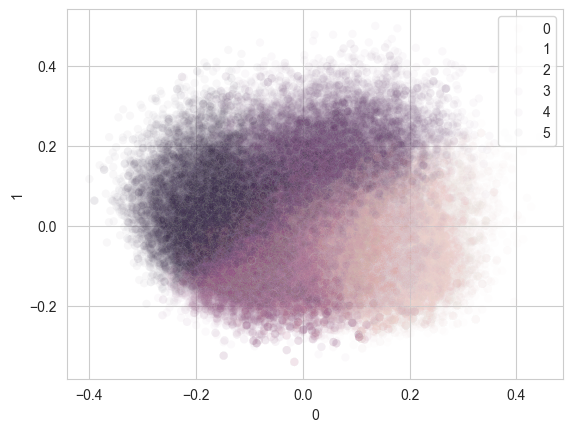

In [31]:
clusters_plot(sentence_tranformer_embeddings, 'Class_BKmeans', 0.03)

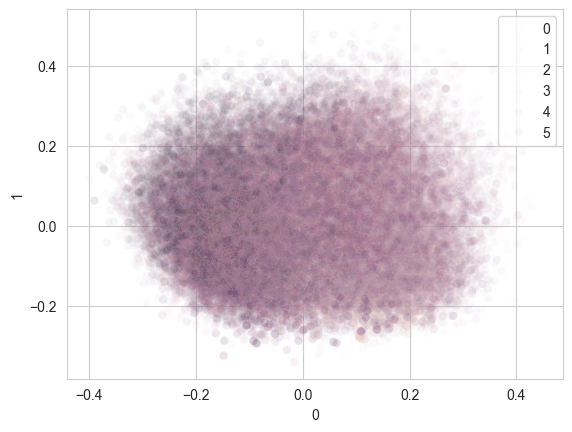

In [32]:
clusters_plot(sentence_tranformer_embeddings, 'Class_BKmeans_PCA', 0.03)

#### Universal Sentence Encoder

> Lets check now the USE model

In [33]:
use_embeddings.head(15)

,Embeddings,Class,Section,Class_BKmeans,Class_BKmeans_PCA
0,"[-0.0396379605, -0.042999919500000004, -0.0274...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,3
1,"[-0.0382796377, -0.0570409745, 0.0563224480000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,2
2,"[-0.040613506, 0.013880508000000001, -0.027027...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,3
3,"[-0.0177038833, -0.0793429762, -0.018696246700...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,4,3
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,3
5,"[-0.0771465674, -0.005537053100000001, -0.0345...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,4,2
6,"[0.0040984116, -0.0659082755, 0.0697822273, -0...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,4,2
7,"[0.0097673088, -0.014623372800000001, 0.012456...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,3
8,"[-0.0419038385, 0.0220187753, 0.0389669724, -0...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,0
9,"[-0.0044452692, -0.030149376000000002, -0.0574...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,3


> Again the number of words seem similar but these doesn't prove the similarity of the classes and clusters

In [34]:
use_embeddings['Class_BKmeans'].value_counts(), use_embeddings['Class'].value_counts()

(Class_BKmeans
 1    22343
 5    18539
 3    16611
 0    11414
 4    10884
 2     8562
 Name: count, dtype: int64,
 Class
 CLASS V WORDS RELATING TO THE VOLUNTARY POWERS               21777
 CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS    18219
 CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES        13846
 CLASS I WORDS EXPRESSING ABSTRACT RELATIONS                  13837
 CLASS II WORDS RELATING TO SPACE                             11750
 CLASS III WORDS RELATING TO MATTER                            8924
 Name: count, dtype: int64)

In [35]:
use_embeddings['Class_BKmeans_PCA'].value_counts(), use_embeddings['Class'].value_counts()

(Class_BKmeans_PCA
 2    20212
 5    18128
 3    16568
 0    14864
 1     9565
 4     9016
 Name: count, dtype: int64,
 Class
 CLASS V WORDS RELATING TO THE VOLUNTARY POWERS               21777
 CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS    18219
 CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES        13846
 CLASS I WORDS EXPRESSING ABSTRACT RELATIONS                  13837
 CLASS II WORDS RELATING TO SPACE                             11750
 CLASS III WORDS RELATING TO MATTER                            8924
 Name: count, dtype: int64)

> Also here we see the same results. A mixed categorization of the words and a sliced one too.

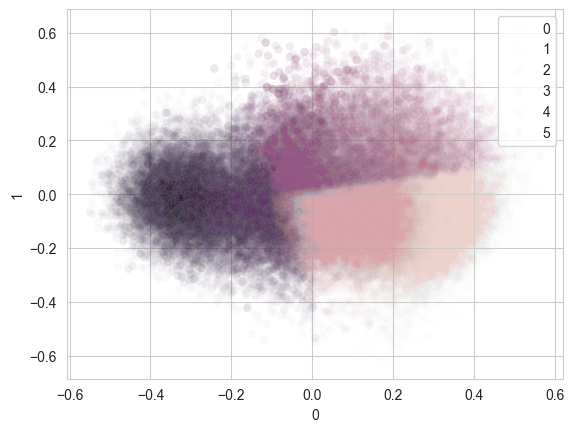

In [36]:
clusters_plot(use_embeddings, 'Class_BKmeans', 0.02)

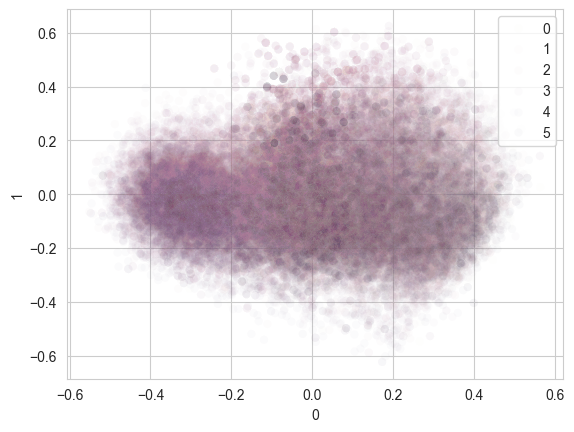

In [37]:
clusters_plot(use_embeddings, 'Class_BKmeans_PCA', 0.02)

### Hierarchical Clustering

> The hierarchical clustering is a clustering that took very long to run so in order to see some resutls faster l took the 2/3 of the embeddings and run the clustering. <br>
> The sample was not taken from the whole dataframes but we iretated each class and took the 2/3 of each class in order to have the same percentage of the words in each class as if we had the whole model.

In [38]:
def embeddings_class_sample(df):
    sampled_df = pd.DataFrame()  # Empty DataFrame to store samples
    for cluster in df.Class.unique():
        cluster_df = df[df['Class'] == cluster]
        sampled_cluster = cluster_df.sample(int(len(cluster_df) * 2 / 3))
        sampled_df = pd.concat([sampled_df, sampled_cluster])

    return sampled_df

> The hierarchical clustering has been done the same way the BKmeans but here we didn't reduced the dimension of the embeddings.

In [39]:
# The input of the method is a list, containing the dataframes of the embeddings. We iretate every dataframe and we take the sample of the dataframe.
# The we done the clustering in the 2/3 of the actuall dataframe. Then we pass the column that contains the label to the actuall dataframe in the indexes we took.
# The output is a list that contains the dataframes we took in the same order but with the hierarchical column added.

def hierarchical_clustering(models: list()):
    new_models_list = list()
    for model in models:
        sampled_df = embeddings_class_sample(model)
    
        hier_clustering = AgglomerativeClustering(n_clusters=sampled_df.Class.nunique(),
                                                  metric='euclidean',
                                                  linkage='ward')
        clusters = hier_clustering.fit(list(sampled_df.Embeddings.values))
        sampled_df['Class_Hierarchical'] = clusters.labels_
        
        model = pd.merge(model,
                         sampled_df[['Class_Hierarchical']],
                         left_index=True,
                         right_index=True,
                         how='outer')
        new_models_list.append(model)

    return new_models_list

In [40]:
sentence_tranformer_embeddings, use_embeddings = hierarchical_clustering([sentence_tranformer_embeddings, use_embeddings])

#### Sentence Transformer

In [41]:
sentence_tranformer_embeddings.head()

,Embeddings,Class,Section,Class_BKmeans,Class_BKmeans_PCA,Class_Hierarchical
0,"[-0.06880877170000001, 0.0015575370000000001, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1,2.0
1,"[0.0024004122000000003, 0.020551782100000002, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1,2.0
2,"[-0.0097784037, -3.9502e-05, -0.01282439660000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,2,0,NaN
3,"[-0.012498525, 0.0810882673, -0.0504169427, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,2,2,NaN
4,"[-0.0132661257, 0.0121876495, -0.0619583502000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1,5.0


In [42]:
sentence_tranformer_embeddings.Class_Hierarchical.value_counts(), sentence_tranformer_embeddings.Class.value_counts()

(Class_Hierarchical
 0.0    15227
 3.0    13610
 1.0    11097
 5.0     9913
 2.0     8020
 4.0     1033
 Name: count, dtype: int64,
 Class
 CLASS V WORDS RELATING TO THE VOLUNTARY POWERS               21777
 CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS    18219
 CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES        13846
 CLASS I WORDS EXPRESSING ABSTRACT RELATIONS                  13837
 CLASS II WORDS RELATING TO SPACE                             11750
 CLASS III WORDS RELATING TO MATTER                            8924
 Name: count, dtype: int64)

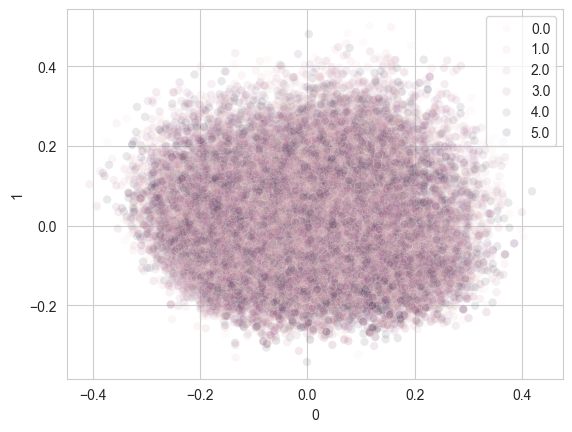

In [43]:
clusters_plot(sentence_tranformer_embeddings.dropna(subset=['Class_Hierarchical']), 'Class_Hierarchical', 0.1)

#### Universal Sentence Encoder

In [44]:
use_embeddings.head()

,Embeddings,Class,Section,Class_BKmeans,Class_BKmeans_PCA,Class_Hierarchical
0,"[-0.0396379605, -0.042999919500000004, -0.0274...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,3,5.0
1,"[-0.0382796377, -0.0570409745, 0.0563224480000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,2,NaN
2,"[-0.040613506, 0.013880508000000001, -0.027027...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,3,NaN
3,"[-0.0177038833, -0.0793429762, -0.018696246700...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,4,3,5.0
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,3,0.0


In [45]:
use_embeddings.Class_Hierarchical.value_counts(), use_embeddings.Class.value_counts()

(Class_Hierarchical
 2.0    18489
 5.0    11787
 1.0    10806
 0.0    10351
 3.0     5166
 4.0     2301
 Name: count, dtype: int64,
 Class
 CLASS V WORDS RELATING TO THE VOLUNTARY POWERS               21777
 CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS    18219
 CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES        13846
 CLASS I WORDS EXPRESSING ABSTRACT RELATIONS                  13837
 CLASS II WORDS RELATING TO SPACE                             11750
 CLASS III WORDS RELATING TO MATTER                            8924
 Name: count, dtype: int64)

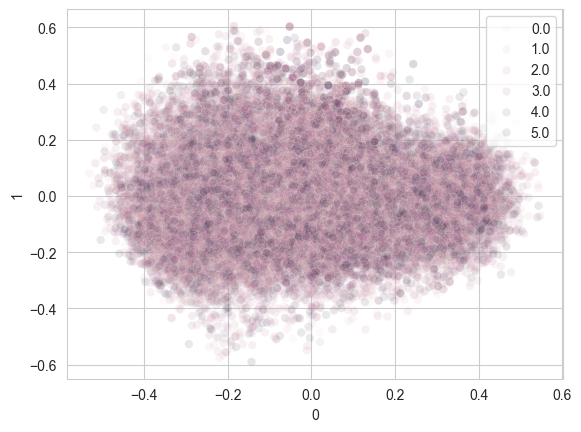

In [46]:
clusters_plot(use_embeddings.dropna(subset=['Class_Hierarchical']), 'Class_Hierarchical', 0.1)

## 5. Clustering Classes vs Roget's Classes
---

> The similarity check between the clusters and the classes will be done with 2 ways.

> First with the help of the cosine similarity we will take an average embedding for every cluster and class and we will take every cosine similarity score possible. The result of the **cosine_similarity_check** methos is a table the the rows are the clusters and the columns the classes that roget did. The values are the score of the cosine similarity.

> Second we can check manually for every cluster and class the intersection of these two with the method **same_words_percentage**. When l say intersection l mean the words that exists in both dataframes. This can be done easily by checking the percentage of the indexes of every cluster, exists in every class. The output will be again a table that the rows are the cluster, the columns are roget's classes and the values the percentage of the words of the cluster that exists in each class.

> Also with the **similarity_plot** we plot the results from the cosine similarity check. For every cluster we will plot in 2d the embeddings of the cluster and the class with the highest cosine similarity.

In [47]:
# This method was created to be dynamicly and can be used in both class clustering and section clustering
# So as input we have the dataframe we wont to check the cosine similarities and we also pass the cluster column and class column

def cosine_similarity_check(df, cluster_col: str, class_col: str):
    results = list()

    # for every cluster in the cluster column we iretate and take the avg embedding the cluster have
    for cluster in df[cluster_col].unique():
        df_cluster = df[df[cluster_col] == cluster]
        avg_cluster_embedding = np.stack(df_cluster['Embeddings'].values).mean(axis=0)

        # initialize a new row to pass in the results
        new_row = list()

        # For every class in the class column that we wont to check the similarity we iterate and take again the avg embedding.
        for roget_class in df[class_col].unique():
            df_roget_class = df[df[class_col] == roget_class]
            avg_roget_embedding = np.stack(df_roget_class['Embeddings'].values).mean(axis=0)

            # Calculate the cosine similarity between the avg cluster embedding and the avg class embedding and pass it to new row
            new_row.append(cosine_similarity([avg_cluster_embedding], [avg_roget_embedding]).item())

        # pass the new row in the results with the cluster that the cosine similarity refers too
        new_row.append(cluster)
        results.append(new_row)

    # Make the results a df and set as indexes the cluster that was always in the last cell of each row and as columns the unique classes with order that we were iterating them
    columns = df[class_col].unique().tolist()
    columns.append('Cluster')
    
    results = pd.DataFrame(results, columns=columns)
    return results.set_index('Cluster')

In [48]:
# As inputs takes the dataframe we want to plot, the results from the cosine similarity check and the cluster column that passes in the cosine similarity check.

def similarity_plot(df, results, cluster_col):
    fig, axs = plt.subplots(results.index.nunique(), 1, figsize=(12, 22))

    # from the results of the cosine similarity check iterate the results and take the index(cluster) and the row
    for cluster, row in results.iterrows():
        # Take the cluster and the index of the column that the max cosine similarity exists in the row
        cluster = int(cluster)
        rg_class = np.argmax(results.loc[cluster])

        # Take the dataframes of the cluster and the class in order to plot them
        cluster_df = df[df[cluster_col] == cluster]
        rg_class_df = df[df['Class'] == results.columns[rg_class]]

        # Reduce both dataframe's embeddings dimensions to 2
        pca2d = PCA(n_components=2, random_state=33)
        cluster_embeddings = pd.DataFrame(pca2d.fit_transform(list(cluster_df.Embeddings.values)))
        rg_class_embeddings = pd.DataFrame(pca2d.fit_transform(list(rg_class_df.Embeddings.values)))

        # Except for have the whole name of the class we wont extract only the class and the number (Class IV)
        cluster_label = r'Cluster ' + str(cluster)
        class_label = re.search(r"(CLASS\s+(?:I{1,3}|IV|V|VI{0,3}))", results.columns[rg_class][:9]).group(1)

        # Plot both the embeddings
        sns.scatterplot(x=cluster_embeddings[0], y=cluster_embeddings[1], alpha=0.05, ax=axs[cluster], label=cluster_label, color='lightblue')
        sns.scatterplot(x=rg_class_embeddings[0], y=rg_class_embeddings[1], alpha=0.05, ax=axs[cluster], label=class_label, color='orange')
        axs[cluster].set_xlabel(None)
        axs[cluster].set_ylabel(None)
        axs[cluster].legend(loc='upper right')
        
    plt.show()

In [49]:
def same_words_percentage(df, cluster_col, class_col):
    results = list()

    # For every cluster in the column that was given we iterate the whole dataframe
    for cluster in df[cluster_col].unique():

        # We take the part of the dataframe that has this cluster.
        cluster_df = df[df[cluster_col] == cluster]

        # We initialize the new row that we will append in the results and we pass the cluster
        new_row = [cluster]
        
        # For every class that roget created we iterate and take the part of the dataframe that has this class
        for rg_class in df[class_col].unique():
            rg_class_df = df[df[class_col] == rg_class]

            # Find common indexes
            common_indexes = cluster_df.index.intersection(rg_class_df.index)
            new_row.append(len(common_indexes) / len(cluster_df))

        # Append the new row 
        results.append(new_row)

    # Set as index the cluster in order to know to which cluster the row refers to and return the results
    columns = ['cluster'] + list(df[class_col].unique())
    results = pd.DataFrame(results, columns=columns).set_index('cluster')
    
    return results

### Bisecting Kmean Similarity

#### Sentence Transformer

> The same words percentage have a more clear view of which words exist in each cluster. we can see that almost every cluster contains many words from almost every class so the BKmeans didnt had good results

In [50]:
results = same_words_percentage(sentence_tranformer_embeddings, 'Class_BKmeans', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
cluster,,,,,,
1,0.209599,0.065857,0.042158,0.221031,0.242944,0.218411
2,0.223518,0.141157,0.063929,0.163478,0.293358,0.114559
4,0.175744,0.083994,0.082558,0.187407,0.212513,0.257785
0,0.137371,0.114994,0.059327,0.171490,0.325644,0.191173
3,0.116346,0.204007,0.154750,0.094460,0.229233,0.201205
5,0.119497,0.153654,0.154901,0.138744,0.200987,0.232216


In [51]:
np.argmax(results, axis=1)

array([4, 4, 5, 4, 4, 5], dtype=int64)

> The cosine similarity says that between the clusters and the classes seems to be strangely high, knowing that the words that the clusters contains are mixed from every class.

In [52]:
results = cosine_similarity_check(sentence_tranformer_embeddings, 'Class_BKmeans', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
Cluster,,,,,,
1,0.908348,0.849603,0.827310,0.906428,0.900534,0.893582
2,0.936409,0.922011,0.880933,0.909841,0.928806,0.875158
4,0.916009,0.856164,0.874890,0.929127,0.899431,0.925267
0,0.871627,0.854528,0.810991,0.878866,0.903559,0.868895
3,0.920622,0.963721,0.954552,0.902346,0.935774,0.928113
5,0.880542,0.912920,0.934959,0.881106,0.887151,0.913567


In [53]:
np.argmax(results, axis=1)

array([0, 0, 3, 4, 1, 2], dtype=int64)

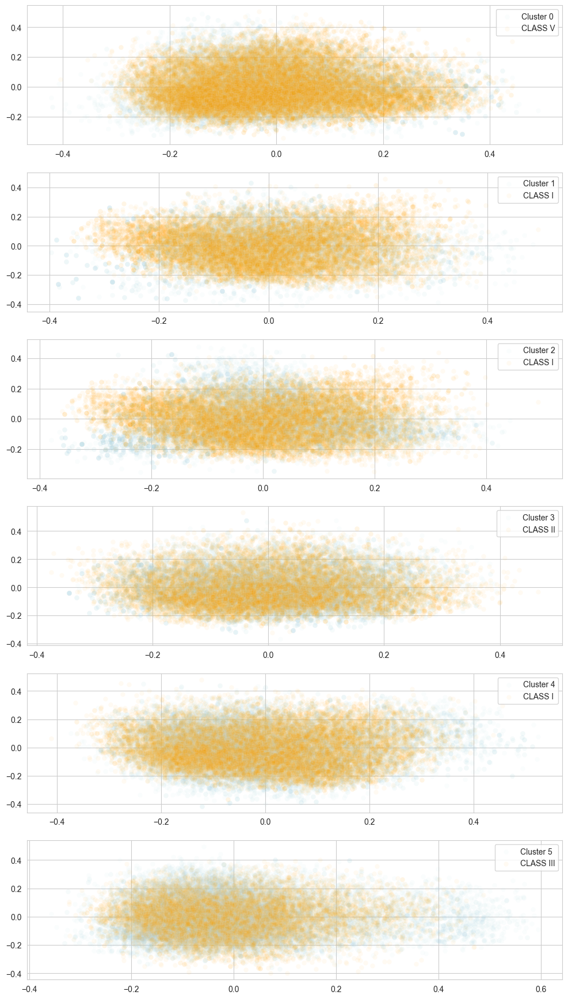

In [54]:
similarity_plot(sentence_tranformer_embeddings, results, 'Class_BKmeans')

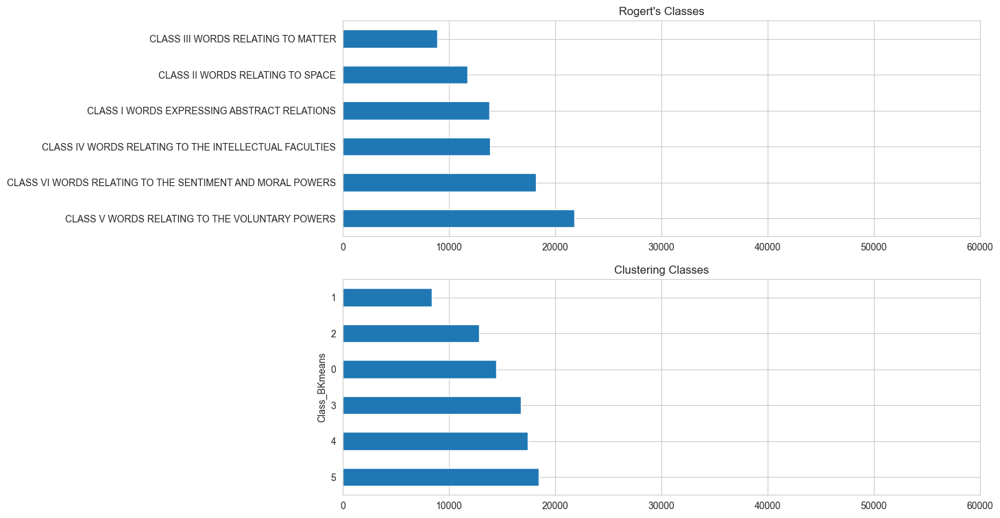

In [55]:
fig, axs = plt.subplots(2, 1, figsize=(12, 9))

rogert_words['Class'].value_counts().plot(kind='barh', ax=axs[0], title="Rogert's Classes")
axs[0].set_xlim([0, 60000])
axs[0].set_ylabel(None)

sentence_tranformer_embeddings['Class_BKmeans'].value_counts().plot(kind='barh', ax=axs[1], title="Clustering Classes")
axs[1].set_xlim([0, 60000])

plt.show()

> The results are excatly the same even if we have done PCA before the BKmeans and the word of each cluster are mixed from every class and the cosine similarity of the avg embeddings are strangely high.

In [56]:
results = same_words_percentage(sentence_tranformer_embeddings, 'Class_BKmeans_PCA', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
cluster,,,,,,
1,0.255286,0.057525,0.047264,0.243470,0.240775,0.155680
0,0.184813,0.180088,0.069436,0.132113,0.285095,0.148454
2,0.110411,0.155175,0.124282,0.128652,0.225903,0.255576
3,0.167968,0.087635,0.059245,0.179196,0.275275,0.230681
4,0.110639,0.162815,0.189434,0.134400,0.216788,0.185923
5,0.140172,0.153982,0.139757,0.143287,0.205378,0.217423


In [57]:
np.argmax(results, axis=1)

array([0, 4, 5, 4, 4, 5], dtype=int64)

In [58]:
results = cosine_similarity_check(sentence_tranformer_embeddings, 'Class_BKmeans_PCA', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
Cluster,,,,,,
1,0.945175,0.877628,0.868674,0.945739,0.926163,0.917087
0,0.962750,0.955160,0.905492,0.942734,0.966389,0.926828
2,0.930201,0.953888,0.958783,0.930063,0.945174,0.961087
3,0.963320,0.925135,0.908823,0.964463,0.970123,0.960798
4,0.932247,0.957816,0.971826,0.928004,0.938100,0.933634
5,0.902642,0.918582,0.934996,0.901562,0.902992,0.924087


In [59]:
np.argmax(results, axis=1)

array([3, 4, 5, 4, 2, 2], dtype=int64)

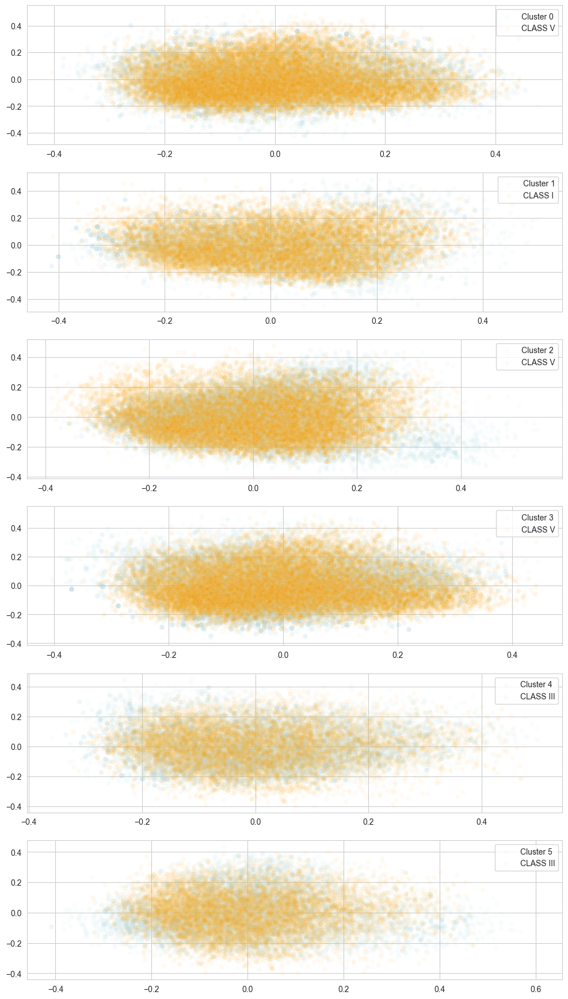

In [60]:
similarity_plot(sentence_tranformer_embeddings, results, 'Class_BKmeans_PCA')

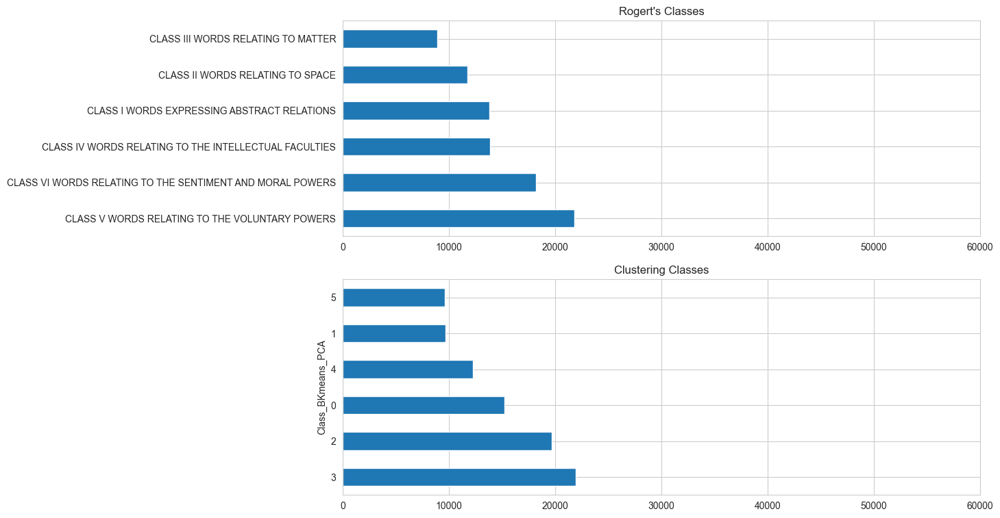

In [61]:
fig, axs = plt.subplots(2, 1, figsize=(12, 9))

rogert_words['Class'].value_counts().plot(kind='barh', ax=axs[0], title="Rogert's Classes")
axs[0].set_xlim([0, 60000])
axs[0].set_ylabel(None)

sentence_tranformer_embeddings['Class_BKmeans_PCA'].value_counts().plot(kind='barh', ax=axs[1], title="Clustering Classes")
axs[1].set_xlim([0, 60000])

plt.show()

#### Universal Sentence Encoder

> The results didnt actually changed from sentence transformer to use and if we check the percentage of words and the cosine similarity are very similar and here with the above case even if we do PCA or not.

In [62]:
results = same_words_percentage(use_embeddings, 'Class_BKmeans', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
cluster,,,,,,
3,0.238878,0.135934,0.068388,0.167479,0.253266,0.136054
4,0.158949,0.112918,0.090500,0.153344,0.225285,0.259004
1,0.119277,0.148279,0.138030,0.144117,0.226514,0.223784
0,0.113983,0.061065,0.063343,0.203172,0.292623,0.265814
2,0.186171,0.140972,0.046835,0.158608,0.327260,0.140154
5,0.139112,0.164302,0.139975,0.134743,0.211176,0.210691


In [63]:
np.argmax(results, axis=1)

array([4, 5, 4, 4, 4, 4], dtype=int64)

In [64]:
results = cosine_similarity_check(use_embeddings, 'Class_BKmeans', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
Cluster,,,,,,
3,0.939998,0.889753,0.852188,0.898963,0.906437,0.860145
4,0.925448,0.904064,0.917547,0.923596,0.917631,0.947878
1,0.885355,0.911249,0.931482,0.907254,0.919932,0.931507
0,0.580338,0.572896,0.579351,0.650124,0.664448,0.666106
2,0.785034,0.745963,0.674853,0.770032,0.813228,0.720307
5,0.866497,0.889421,0.903173,0.845256,0.849015,0.868399


In [65]:
np.argmax(results, axis=1)

array([0, 5, 5, 5, 4, 2], dtype=int64)

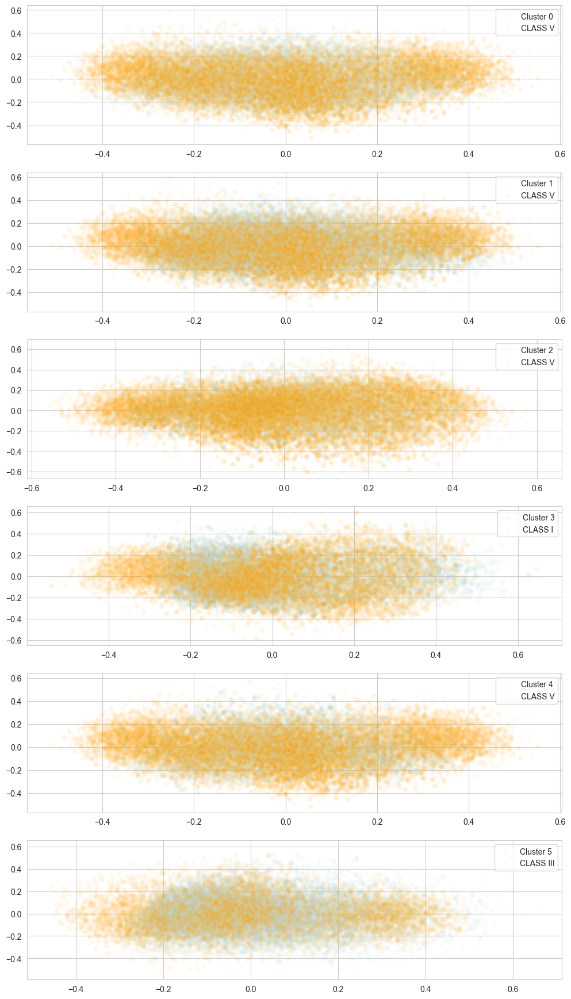

In [66]:
similarity_plot(use_embeddings, results, 'Class_BKmeans')

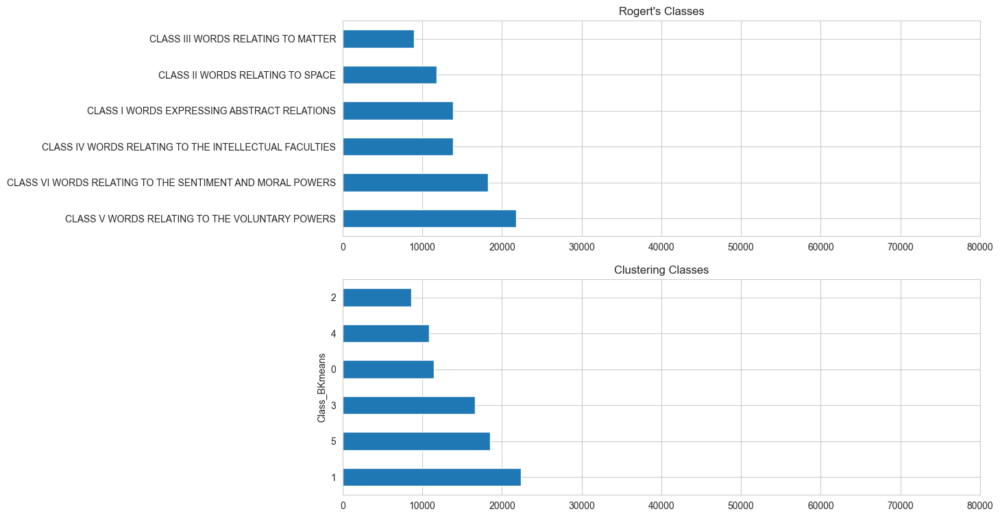

In [67]:
fig, axs = plt.subplots(2, 1, figsize=(12, 9))

rogert_words['Class'].value_counts().plot(kind='barh', ax=axs[0], title="Rogert's Classes")
axs[0].set_xlim([0, 80000])
axs[0].set_ylabel(None)

use_embeddings['Class_BKmeans'].value_counts().plot(kind='barh', ax=axs[1], title="Clustering Classes")
axs[1].set_xlim([0, 80000])

plt.show()

In [68]:
results = same_words_percentage(use_embeddings, 'Class_BKmeans_PCA', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
cluster,,,,,,
3,0.202197,0.071765,0.059392,0.176847,0.251811,0.237989
2,0.175292,0.110232,0.080150,0.190481,0.225708,0.218138
0,0.145587,0.120829,0.073802,0.167115,0.294201,0.198466
5,0.134654,0.190093,0.121911,0.119153,0.268314,0.165876
4,0.143412,0.147072,0.132431,0.141083,0.209516,0.226486
1,0.109357,0.184527,0.190173,0.120230,0.200418,0.195295


In [69]:
np.argmax(results, axis=1)

array([4, 4, 4, 4, 5, 4], dtype=int64)

In [70]:
results = cosine_similarity_check(use_embeddings, 'Class_BKmeans_PCA', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
Cluster,,,,,,
3,0.948731,0.883976,0.880920,0.943683,0.943555,0.940598
2,0.960912,0.926691,0.920509,0.955525,0.946329,0.949738
0,0.936151,0.928802,0.906956,0.943554,0.965614,0.929665
5,0.906788,0.943852,0.931018,0.904223,0.942467,0.914876
4,0.853760,0.873641,0.892582,0.835801,0.837839,0.865056
1,0.868335,0.924861,0.937603,0.873860,0.900007,0.899535


In [71]:
np.argmax(results, axis=1)

array([0, 0, 4, 1, 2, 2], dtype=int64)

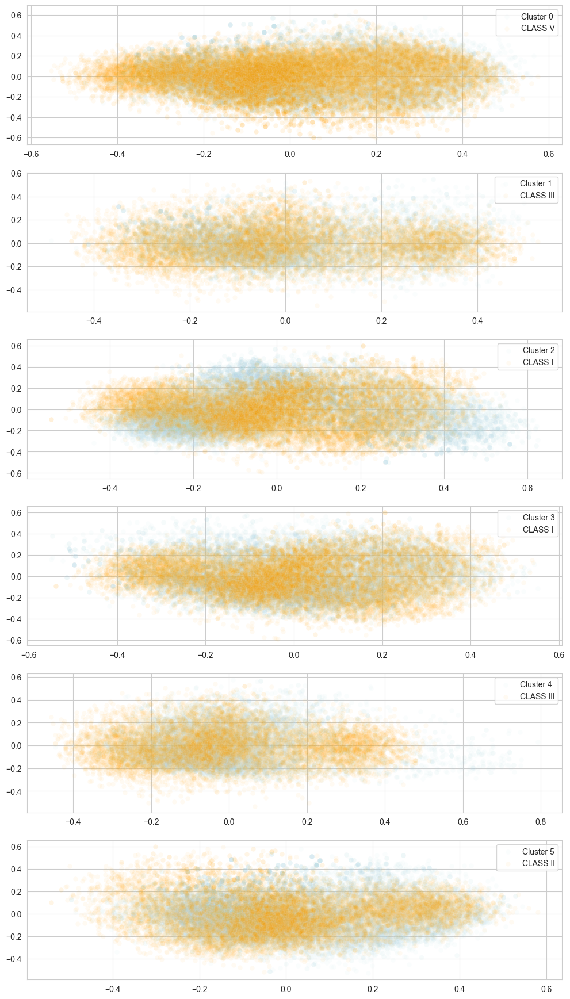

In [72]:
similarity_plot(use_embeddings, results, 'Class_BKmeans_PCA')

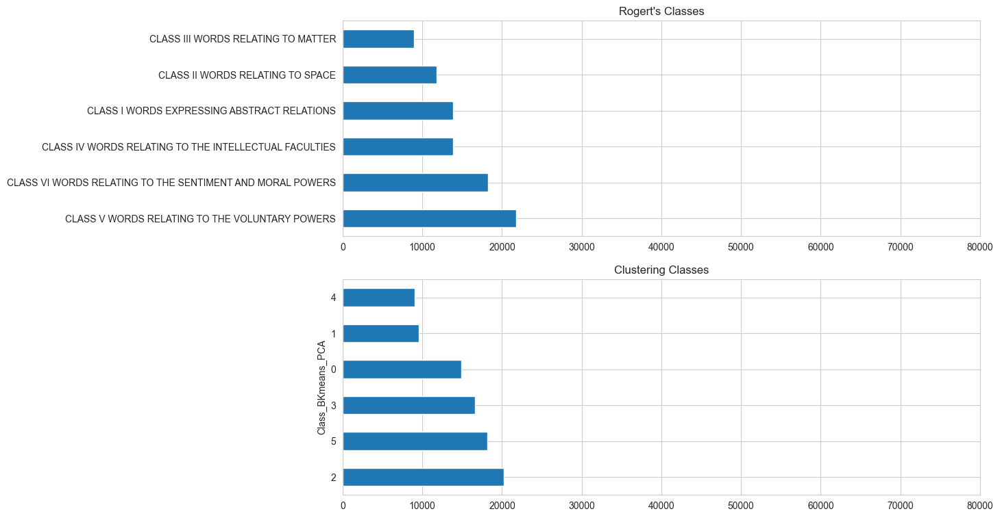

In [73]:
fig, axs = plt.subplots(2, 1, figsize=(12, 9))

rogert_words['Class'].value_counts().plot(kind='barh', ax=axs[0], title="Rogert's Classes")
axs[0].set_xlim([0, 80000])
axs[0].set_ylabel(None)

use_embeddings['Class_BKmeans_PCA'].value_counts().plot(kind='barh', ax=axs[1], title="Clustering Classes")
axs[1].set_xlim([0, 80000])

plt.show()

### Hierarchical Similarity

#### Sentence Transformer

> We extract the row that we did the hierarchical clustering and we will use these dataframe to check the similarity with the classes

In [74]:
print(sentence_tranformer_embeddings.shape)
st_hierarchical_df = sentence_tranformer_embeddings[sentence_tranformer_embeddings['Class_Hierarchical'].isna() == False]
st_hierarchical_df

(88353, 6)


,Embeddings,Class,Section,Class_BKmeans,Class_BKmeans_PCA,Class_Hierarchical
0,"[-0.06880877170000001, 0.0015575370000000001, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1,2.0
1,"[0.0024004122000000003, 0.020551782100000002, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1,2.0
4,"[-0.0132661257, 0.0121876495, -0.0619583502000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1,5.0
5,"[-0.07032973320000001, -0.0212071221, -0.03459...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,4,1,5.0
6,"[-0.039351008800000004, 0.0631144419, -0.04712...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,3,5.0
...,...,...,...,...,...,...
88348,"[0.0255490765, 0.0240662042, -0.0762141049, -0...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...,SECTION V. RELIGIOUS AFFECTIONS,5,2,1.0
88349,"[0.0169134196, -0.0647304654, -0.0094027240000...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...,SECTION V. RELIGIOUS AFFECTIONS,5,2,3.0
88350,"[0.073002696, -0.024290988200000002, -0.079109...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...,SECTION V. RELIGIOUS AFFECTIONS,4,2,1.0
88351,"[0.0125833051, 0.0338308141, -0.01210350360000...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...,SECTION V. RELIGIOUS AFFECTIONS,5,2,4.0


> The same as the BKmeans the words of the clusters are a mix from every class that roget created and the cosine similarity seems to be wrongly too high.

In [75]:
results = same_words_percentage(st_hierarchical_df, 'Class_Hierarchical', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
cluster,,,,,,
2.0,0.190025,0.119950,0.088903,0.143890,0.236534,0.220698
5.0,0.172097,0.051246,0.050237,0.254817,0.231413,0.240190
1.0,0.178787,0.072632,0.052627,0.170677,0.310174,0.215103
0.0,0.151179,0.193735,0.132922,0.128850,0.245485,0.147830
3.0,0.114034,0.186627,0.150478,0.112050,0.211609,0.225202
4.0,0.151016,0.064860,0.079380,0.163601,0.258470,0.282672


In [76]:
np.argmax(results, axis=1)

array([4, 3, 4, 4, 5, 5], dtype=int64)

In [77]:
results = cosine_similarity_check(st_hierarchical_df, 'Class_Hierarchical', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
Cluster,,,,,,
2.0,0.939239,0.906884,0.915836,0.935769,0.927311,0.940958
5.0,0.948905,0.893265,0.887267,0.962943,0.946046,0.950155
1.0,0.965531,0.934921,0.914299,0.958520,0.975680,0.953658
0.0,0.957416,0.974717,0.947778,0.943604,0.964928,0.939711
3.0,0.935476,0.969611,0.975336,0.931226,0.947292,0.958300
4.0,0.620084,0.615695,0.626112,0.622731,0.620097,0.643226


In [78]:
np.argmax(results, axis=1)

array([5, 3, 4, 1, 2, 5], dtype=int64)

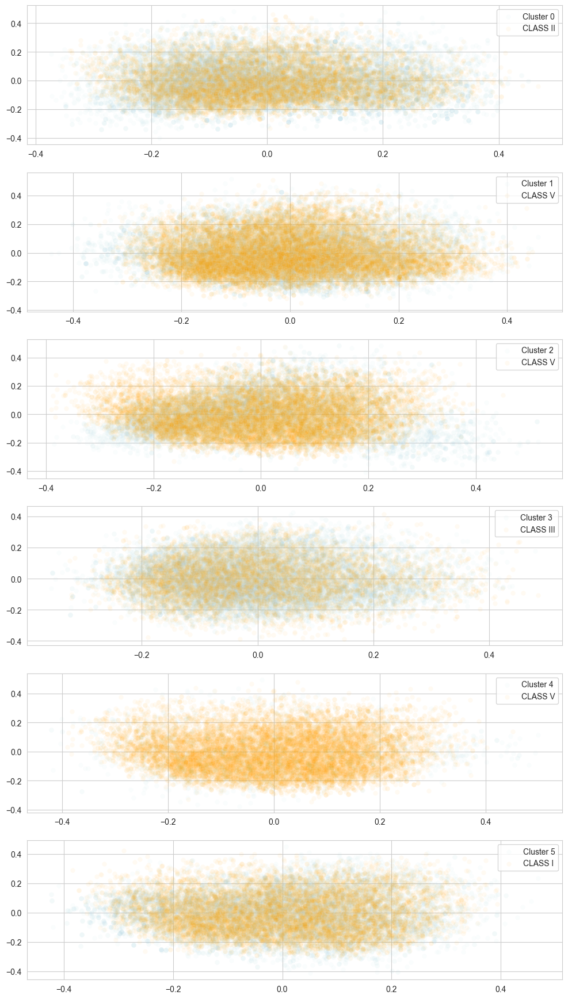

In [79]:
similarity_plot(st_hierarchical_df, results, 'Class_Hierarchical')

#### Universal Sentence Encoder

> We extract the row that we did the hierarchical clustering and we will use these dataframe to check the similarity with the classes

In [80]:
print(use_embeddings.shape)
use_hierarchical_df = use_embeddings[use_embeddings['Class_Hierarchical'].isna() == False]
use_hierarchical_df

(88353, 6)


,Embeddings,Class,Section,Class_BKmeans,Class_BKmeans_PCA,Class_Hierarchical
0,"[-0.0396379605, -0.042999919500000004, -0.0274...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,3,5.0
3,"[-0.0177038833, -0.0793429762, -0.018696246700...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,4,3,5.0
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,3,0.0
6,"[0.0040984116, -0.0659082755, 0.0697822273, -0...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,4,2,1.0
7,"[0.0097673088, -0.014623372800000001, 0.012456...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,3,3,0.0
...,...,...,...,...,...,...
88348,"[0.0491876565, -0.0453704819, 0.0396645963, -0...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...,SECTION V. RELIGIOUS AFFECTIONS,5,3,2.0
88349,"[-0.0353110284, -0.0295349434, 0.0116038844, 0...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...,SECTION V. RELIGIOUS AFFECTIONS,3,3,5.0
88350,"[0.0113966716, -0.035985540600000004, 0.031265...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...,SECTION V. RELIGIOUS AFFECTIONS,5,2,1.0
88351,"[-0.05716852100000001, 0.027027575300000002, -...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...,SECTION V. RELIGIOUS AFFECTIONS,3,3,0.0


> The same as the previous model the words of the clusters are a mix from every class that roget created and the cosine similarity seems to be wrongly too high.

In [81]:
results = same_words_percentage(use_hierarchical_df, 'Class_Hierarchical', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
cluster,,,,,,
5.0,0.199287,0.107831,0.048783,0.221685,0.293289,0.129125
0.0,0.132741,0.070042,0.065211,0.187615,0.240460,0.303932
1.0,0.142421,0.155192,0.132704,0.139552,0.217009,0.213122
3.0,0.265970,0.130081,0.069493,0.120983,0.217383,0.196090
2.0,0.116177,0.169777,0.152361,0.120396,0.234788,0.206501
4.0,0.191221,0.151673,0.038679,0.137332,0.331595,0.149500


In [82]:
np.argmax(results, axis=1)

array([4, 5, 4, 0, 4, 4], dtype=int64)

In [83]:
results = cosine_similarity_check(use_hierarchical_df, 'Class_Hierarchical', 'Class')
results

,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,CLASS II WORDS RELATING TO SPACE,CLASS III WORDS RELATING TO MATTER,CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES,CLASS V WORDS RELATING TO THE VOLUNTARY POWERS,CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS
Cluster,,,,,,
5.0,0.945794,0.905500,0.876511,0.943789,0.947189,0.892649
0.0,0.917870,0.877267,0.885971,0.942168,0.940463,0.958709
1.0,0.872234,0.888265,0.900529,0.852221,0.855459,0.872750
3.0,0.913841,0.843270,0.823554,0.867062,0.872470,0.862101
2.0,0.901817,0.949485,0.958819,0.910467,0.937469,0.937144
4.0,0.730249,0.695565,0.627251,0.723293,0.765443,0.678204


In [84]:
np.argmax(results, axis=1)

array([4, 5, 2, 0, 2, 4], dtype=int64)

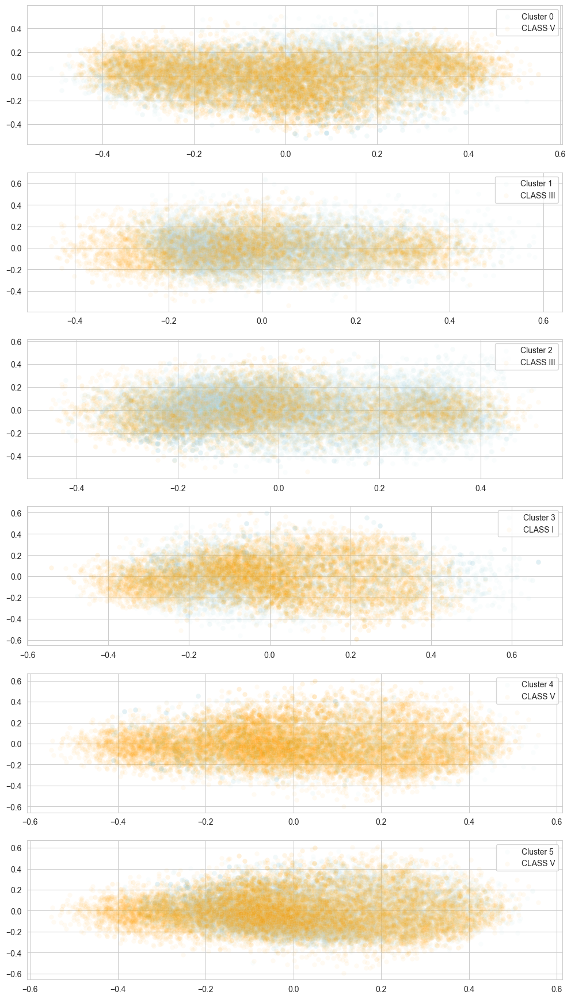

In [85]:
similarity_plot(use_hierarchical_df, results, 'Class_Hierarchical')

## 6. Embedding's Section Clustering
---

> In order to do the section clustering we will take number of sections each class have and we will try aply them in the right cluster. That means that the class clustering upon the class clustering we did we will do the section clustering but the section numbers we will apply in each class will be accordingly the silhouette score the cluster will have with each of the section numbers. So we need to see upon which class clustering we will do the section clustering. We already did 3 clustering (BKmeans, BKmeans PCA, Hierarchical). The answer to that will be given from the silhouette score.

In [86]:
number_of_sections = rogert_words.groupby('Class').Section.nunique().values
number_of_sections

array([8, 4, 3, 2, 2, 5], dtype=int64)

> First the **calculate_silhouette** method will take a dataframe that contains the embeddings and the the column of the class clustering. This method will create a table that the rows will be the clusters of the collumn given and the columns will be the numbers of sections. The values will be the silhouette score between this class cluster and the number of sections

In [87]:
def calculate_silhouette(df, class_cluster_col):
    total_silhouette_scores = list()
    
    for cluster in df[class_cluster_col].unique():
        df_cluster = df[df[class_cluster_col] == cluster]
        embeddings = pd.DataFrame(list(df_cluster.Embeddings.values))
        
        silhouette_row = [cluster]
        for num_sections in number_of_sections:
            bkmeans = BKMeans(n_clusters=num_sections, random_state=33)
            labels = bkmeans.fit_predict(embeddings)
        
            silhouette = silhouette_score(embeddings, labels)    
            silhouette_row.append(silhouette)
        
        total_silhouette_scores.append(silhouette_row)
        
    columns = ['cluster'] + list(number_of_sections)
    total_silhouette_scores = pd.DataFrame(total_silhouette_scores, columns=columns).set_index('cluster')
    
    return total_silhouette_scores

> The **optimal assignment** method will take the results from the calculate silhouette and try to find the optimal path to assign each cluster a number of section to do in order to maximize the totel silhouette score.
>
> In order to do that we take as input the results of the previous method and with the help of Hungarian algorithm we return the indexes of rows and columns that maximize the total silhouette score

In [88]:
def optimal_assignment(results):
    # Convert silhouette scores to costs by subtracting them from a large number
    # This large number should be larger than any silhouette score in your DataFrame
    max_value = results.values.max()
    cost_matrix = max_value - results.to_numpy()
    
    # Apply the Hungarian algorithm to find the optimal assignment
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    
    # Retrieve the original silhouette scores for the optimal assignment
    optimal_scores = results.values[row_ind, col_ind]
    
    # Calculate the total maximum silhouette score
    total_max_silhouette_score = optimal_scores.sum()
    
    print("Optimal assignments (row: original cluster, column: selected n_clusters):")
    for row, col in zip(row_ind, col_ind):
        print(f"Cluster {results.index[row]} -> Number of Clusters {results.columns[col]} with score {results.iloc[row, col]}")
    
    print(f"\nTotal maximum silhouette score achievable: {total_max_silhouette_score}")

    return row_ind, col_ind

> Define a function for clustering sections with inputs both the results of the previous two methods and the dataframe, and the class clustered column.

In [89]:
def sections_clustering(results, silhouette_scores, df, class_cluster_col):
    # Initialize a new column in the dataframe to store the results of Bisecting KMeans clustering.
    df['Section_BKmeans'] = np.nan

    # Keep track of the number of clusters already created to ensure unique cluster IDs
    clusteres_already_created = 0

    # Iterate through results in order to take each rows the optimal cell and perform the clustering.
    for i in range(len(results[0])):
        
        # Retrive the cluster and the n_clusters that is optimal from the results
        cluster = silhouette_scores.index[results[0][i]]
        n_clusters = silhouette_scores.columns[results[1][i]]

        # Initialize the BKMeans clustering algorithm
        bkmeans = BKMeans(n_clusters=n_clusters, random_state=33)

        # Find the indexes of rows in the dataframe that belong to the current cluster in order to update the column Section_BKmeans
        indixes_to_update = df[df[class_cluster_col] == cluster].index

        # Extract the embeddings for rows of the current cluster
        embeddings = pd.DataFrame(list(df[df[class_cluster_col] == cluster].Embeddings.values))

        # Apply the BKMeans clustering to the embeddings and update the 'Section_BKmeans' column in the dataframe
        df.loc[indixes_to_update, 'Section_BKmeans'] = bkmeans.fit_predict(embeddings) + clusteres_already_created

        # Update the count of clusters already created
        clusteres_already_created += n_clusters

### Sentence Tranformer

> So if we use these method in sentence transformer in all 3 different class clusterings we will get the following

In [90]:
silhouette_scores = calculate_silhouette(sentence_tranformer_embeddings, 'Class_BKmeans')
silhouette_scores

,8,4,3,2,2,5
cluster,,,,,,
1,0.013936,0.014935,0.018186,0.017457,0.017457,0.013644
2,0.011590,0.014560,0.012307,0.020682,0.020682,0.013680
4,0.011460,0.008430,0.017902,0.016210,0.016210,0.009023
0,0.009272,0.012029,0.017440,0.016440,0.016440,0.013301
3,0.011485,0.012655,0.011809,0.012990,0.012990,0.011326
5,0.008367,0.011095,0.018150,0.019188,0.019188,0.012503


In [91]:
optimal_assignment(silhouette_scores)

Optimal assignments (row: original cluster, column: selected n_clusters):
Cluster 1 -> Number of Clusters 8 with score 0.013935664191512983
Cluster 2 -> Number of Clusters 2 with score 0.020681730997093348
Cluster 4 -> Number of Clusters 3 with score 0.017901634752959382
Cluster 0 -> Number of Clusters 5 with score 0.013300534952018953
Cluster 3 -> Number of Clusters 4 with score 0.012655438448503432
Cluster 5 -> Number of Clusters 2 with score 0.019187808226385352

Total maximum silhouette score achievable: 0.09766281156847346


(array([0, 1, 2, 3, 4, 5], dtype=int64),
 array([0, 3, 2, 5, 1, 4], dtype=int64))

In [92]:
silhouette_scores = calculate_silhouette(sentence_tranformer_embeddings, 'Class_BKmeans_PCA')
silhouette_scores

,8,4,3,2,2,5
cluster,,,,,,
1,0.017420,0.014784,0.018360,0.024388,0.024388,0.016351
0,0.012128,0.015423,0.018172,0.019727,0.019727,0.015388
2,0.010342,0.011877,0.015810,0.014712,0.014712,0.013522
3,0.008988,0.012945,0.012749,0.017279,0.017279,0.010638
4,0.012566,0.014013,0.016537,0.018613,0.018613,0.015239
5,0.011463,0.015094,0.014936,0.020214,0.020214,0.013851


In [93]:
optimal_assignment(silhouette_scores)

Optimal assignments (row: original cluster, column: selected n_clusters):
Cluster 1 -> Number of Clusters 2 with score 0.024387588215757344
Cluster 0 -> Number of Clusters 3 with score 0.01817175975750644
Cluster 2 -> Number of Clusters 5 with score 0.013521907759840062
Cluster 3 -> Number of Clusters 4 with score 0.012944748726659457
Cluster 4 -> Number of Clusters 8 with score 0.012565821419069825
Cluster 5 -> Number of Clusters 2 with score 0.02021441152685236

Total maximum silhouette score achievable: 0.10180623740568549


(array([0, 1, 2, 3, 4, 5], dtype=int64),
 array([3, 2, 5, 1, 0, 4], dtype=int64))

In [94]:
silhouette_scores = calculate_silhouette(sentence_tranformer_embeddings[sentence_tranformer_embeddings['Class_Hierarchical'].isna() == False], 'Class_Hierarchical')
silhouette_scores

,8,4,3,2,2,5
cluster,,,,,,
2.0,0.020157,0.016241,0.022850,0.021726,0.021726,0.017299
5.0,0.013121,0.017537,0.015692,0.021032,0.021032,0.013074
1.0,0.014848,0.013373,0.012188,0.018077,0.018077,0.015211
0.0,0.011416,0.012912,0.018845,0.019292,0.019292,0.013178
3.0,0.005181,0.008384,0.012100,0.013200,0.013200,0.007489
4.0,0.009101,0.014801,0.035218,0.035484,0.035484,0.014058


In [95]:
results = optimal_assignment(silhouette_scores)
results

Optimal assignments (row: original cluster, column: selected n_clusters):
Cluster 2.0 -> Number of Clusters 8 with score 0.02015704364954697
Cluster 5.0 -> Number of Clusters 4 with score 0.01753658393522007
Cluster 1.0 -> Number of Clusters 5 with score 0.015211484976555114
Cluster 0.0 -> Number of Clusters 2 with score 0.01929209453675126
Cluster 3.0 -> Number of Clusters 2 with score 0.013200260181828403
Cluster 4.0 -> Number of Clusters 3 with score 0.035218282087218715

Total maximum silhouette score achievable: 0.12061574936712052


(array([0, 1, 2, 3, 4, 5], dtype=int64),
 array([0, 1, 5, 3, 4, 2], dtype=int64))

> The hierarchical class clustering have the biggest total silhouette score so will continue with this in our section clustering.

In [96]:
sections_clustering(results, silhouette_scores, sentence_tranformer_embeddings, 'Class_Hierarchical')

In [97]:
sentence_tranformer_embeddings.Section_BKmeans.nunique()

24

In [98]:
sentence_tranformer_embeddings.head()

,Embeddings,Class,Section,Class_BKmeans,Class_BKmeans_PCA,Class_Hierarchical,Section_BKmeans
0,"[-0.06880877170000001, 0.0015575370000000001, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1,2.0,4.0
1,"[0.0024004122000000003, 0.020551782100000002, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1,2.0,5.0
2,"[-0.0097784037, -3.9502e-05, -0.01282439660000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,2,0,NaN,NaN
3,"[-0.012498525, 0.0810882673, -0.0504169427, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,2,2,NaN,NaN
4,"[-0.0132661257, 0.0121876495, -0.0619583502000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,1,1,5.0,8.0


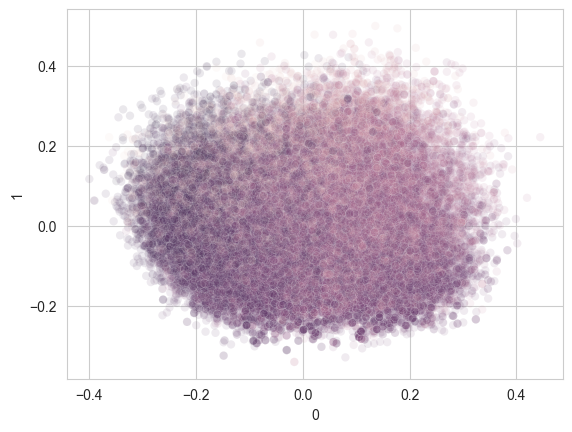

In [99]:
clusters_plot(sentence_tranformer_embeddings, 'Section_BKmeans', 0.1)

### Universal Sentence Encoder

> So if we use these method in Universal Sentence Encoder in all 3 different class clusterings we will get the following

In [100]:
silhouette_scores = calculate_silhouette(use_embeddings, 'Class_BKmeans')
silhouette_scores

,8,4,3,2,2,5
cluster,,,,,,
3,0.015694,0.015528,0.024285,0.035261,0.035261,0.014733
4,0.003267,0.005280,0.021644,0.020525,0.020525,0.007478
1,0.006806,0.013558,0.018846,0.021118,0.021118,0.008880
0,0.006166,0.010953,0.022994,0.022233,0.022233,0.011364
2,0.014269,0.015268,0.033359,0.033892,0.033892,0.017466
5,0.003865,0.013144,0.010623,0.034952,0.034952,0.009523


In [101]:
optimal_assignment(silhouette_scores)

Optimal assignments (row: original cluster, column: selected n_clusters):
Cluster 3 -> Number of Clusters 2 with score 0.035260883821614554
Cluster 4 -> Number of Clusters 8 with score 0.0032666066463548278
Cluster 1 -> Number of Clusters 4 with score 0.013557889329861628
Cluster 0 -> Number of Clusters 5 with score 0.011364423680584235
Cluster 2 -> Number of Clusters 3 with score 0.03335908522756092
Cluster 5 -> Number of Clusters 2 with score 0.03495220310388404

Total maximum silhouette score achievable: 0.13176109180986023


(array([0, 1, 2, 3, 4, 5], dtype=int64),
 array([3, 0, 1, 5, 2, 4], dtype=int64))

In [102]:
silhouette_scores = calculate_silhouette(use_embeddings[use_embeddings['Class_Hierarchical'].isna() == False], 'Class_Hierarchical')
silhouette_scores

,8,4,3,2,2,5
cluster,,,,,,
5.0,0.005414,0.012531,0.007137,0.031954,0.031954,0.009588
0.0,0.003502,0.007839,0.036915,0.040031,0.040031,0.010926
1.0,0.007781,0.015218,0.016560,0.034252,0.034252,0.011953
3.0,0.020982,0.033304,0.036542,0.048071,0.048071,0.027831
2.0,0.004067,0.007174,0.013462,0.045732,0.045732,0.009889
4.0,0.026805,0.022955,0.052846,0.056775,0.056775,0.026288


In [103]:
optimal_assignment(silhouette_scores)

Optimal assignments (row: original cluster, column: selected n_clusters):
Cluster 5.0 -> Number of Clusters 5 with score 0.009587802417179806
Cluster 0.0 -> Number of Clusters 3 with score 0.03691547946756688
Cluster 1.0 -> Number of Clusters 8 with score 0.007781425001743641
Cluster 3.0 -> Number of Clusters 4 with score 0.03330351986889434
Cluster 2.0 -> Number of Clusters 2 with score 0.04573178056578449
Cluster 4.0 -> Number of Clusters 2 with score 0.056775456202258774

Total maximum silhouette score achievable: 0.19009546352342793


(array([0, 1, 2, 3, 4, 5], dtype=int64),
 array([5, 2, 0, 1, 4, 3], dtype=int64))

In [104]:
silhouette_scores = calculate_silhouette(use_embeddings, 'Class_BKmeans_PCA')
silhouette_scores

,8,4,3,2,2,5
cluster,,,,,,
3,0.009472,0.017043,0.020308,0.026476,0.026476,0.009159
2,0.011022,0.018013,0.053315,0.052755,0.052755,0.013011
0,0.012654,0.016083,0.019500,0.043634,0.043634,0.017371
5,0.007823,0.010865,0.016962,0.034661,0.034661,0.010130
4,0.000600,-0.000419,0.014252,0.045862,0.045862,0.003862
1,0.008307,0.013297,0.010851,0.039355,0.039355,0.009930


In [105]:
results = optimal_assignment(silhouette_scores)
results

Optimal assignments (row: original cluster, column: selected n_clusters):
Cluster 3 -> Number of Clusters 4 with score 0.017043011332426364
Cluster 2 -> Number of Clusters 3 with score 0.05331490102115627
Cluster 0 -> Number of Clusters 5 with score 0.017371123170904536
Cluster 5 -> Number of Clusters 8 with score 0.007823462443944813
Cluster 4 -> Number of Clusters 2 with score 0.04586196450769524
Cluster 1 -> Number of Clusters 2 with score 0.03935516234756667

Total maximum silhouette score achievable: 0.18076962482369388


(array([0, 1, 2, 3, 4, 5], dtype=int64),
 array([1, 2, 5, 0, 3, 4], dtype=int64))

> The Class_BKmeans_PCA class clustering have the biggest total silhouette score so will continue with this in our section clustering.

In [106]:
sections_clustering(results, silhouette_scores, use_embeddings, 'Class_BKmeans_PCA')

In [107]:
use_embeddings.Section_BKmeans.nunique()

24

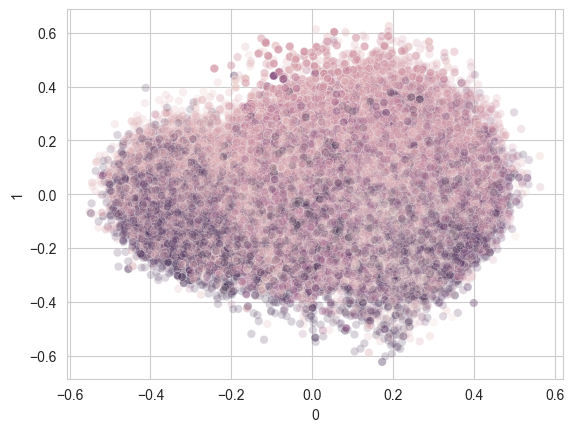

In [108]:
clusters_plot(use_embeddings, 'Section_BKmeans', 0.2)

## 7. Clustering Sections vs Roget's Sections

> In this case cause cosine similarity didnt had good results and it was actually misleading us we will use only the same words percentage method to find where each cluster belong.

### Sentence Transformer

In [109]:
not_nan_sentence_transformer = sentence_tranformer_embeddings.loc[pd.notna(sentence_tranformer_embeddings['Section_BKmeans'])]
same_words_percentage(not_nan_sentence_transformer, 'Section_BKmeans', 'Section')

,SECTION I. EXISTENCE,SECTION II. RELATION,SECTION III. QUANTITY,SECTION IV. ORDER,SECTION V. NUMBER,SECTION VI. TIME,SECTION VII. CHANGE,SECTION VIII. CAUSATION,SECTION I. SPACE IN GENERAL,SECTION II. DIMENSIONS,SECTION III. FORM,SECTION IV. MOTION,SECTION I. MATTER IN GENERAL,SECTION II. INORGANIC MATTER,SECTION III. ORGANIC MATTER,DIVISION (I) FORMATION OF IDEAS,DIVISION (II) COMMUNICATION OF IDEAS,DIVISION (I) INDIVIDUAL VOLITION,DIVISION (II) INTERSOCIAL VOLITION,SECTION I. AFFECTIONS IN GENERAL,SECTION II. PERSONAL AFFECTIONS,SECTION III. SYMPATHETIC AFFECTIONS,SECTION IV. MORAL AFFECTIONS,SECTION V. RELIGIOUS AFFECTIONS
cluster,,,,,,,,,,,,,,,,,,,,,,,,
4.0,0.014947,0.024199,0.042705,0.018505,0.011388,0.022064,0.026335,0.035587,0.012811,0.014235,0.017794,0.017794,0.004982,0.017794,0.045552,0.118149,0.057651,0.178648,0.054093,0.028470,0.086121,0.060498,0.073310,0.016370
5.0,0.019900,0.029022,0.038143,0.019900,0.012438,0.043118,0.031509,0.046434,0.009121,0.039801,0.011609,0.039801,0.002488,0.012438,0.038972,0.083748,0.071310,0.165008,0.074627,0.018242,0.057214,0.030680,0.083748,0.020730
8.0,0.014158,0.032787,0.074888,0.026080,0.017139,0.036140,0.008942,0.032414,0.006706,0.021982,0.005961,0.016021,0.000745,0.007824,0.032414,0.184054,0.076006,0.149031,0.042474,0.005589,0.107303,0.033532,0.054024,0.013785
11.0,0.018655,0.036009,0.035141,0.032104,0.008243,0.010846,0.011280,0.039046,0.004772,0.013449,0.004772,0.009978,0.003905,0.008677,0.031236,0.248590,0.141432,0.153145,0.049024,0.007375,0.043818,0.017354,0.061171,0.009978
10.0,0.006281,0.008375,0.007956,0.012982,0.001675,0.015075,0.006281,0.024707,0.002094,0.005863,0.001675,0.015494,0.002094,0.002094,0.038107,0.154104,0.066583,0.207705,0.064908,0.022194,0.145729,0.059464,0.108878,0.019682
16.0,0.005624,0.007124,0.010124,0.015373,0.004499,0.056618,0.008249,0.022872,0.005624,0.016123,0.003000,0.016498,0.003750,0.003750,0.088489,0.083615,0.086989,0.125984,0.043870,0.032621,0.129734,0.063367,0.052118,0.113986
17.0,0.004206,0.007789,0.037233,0.024147,0.010126,0.023835,0.022122,0.034896,0.012307,0.047048,0.012775,0.098146,0.001091,0.011217,0.044555,0.067768,0.061224,0.236330,0.089422,0.015579,0.066989,0.023680,0.043153,0.004362
19.0,0.007143,0.007512,0.026724,0.019335,0.009113,0.014286,0.009113,0.022906,0.034236,0.059113,0.034852,0.074138,0.004433,0.038547,0.098030,0.050123,0.052586,0.162438,0.062315,0.010222,0.099138,0.035714,0.046305,0.021675
18.0,0.005336,0.009196,0.037693,0.019187,0.026453,0.014532,0.005450,0.023728,0.018506,0.083560,0.039169,0.069596,0.009537,0.053588,0.125227,0.048025,0.080722,0.144982,0.042007,0.009877,0.072548,0.019755,0.027361,0.013965


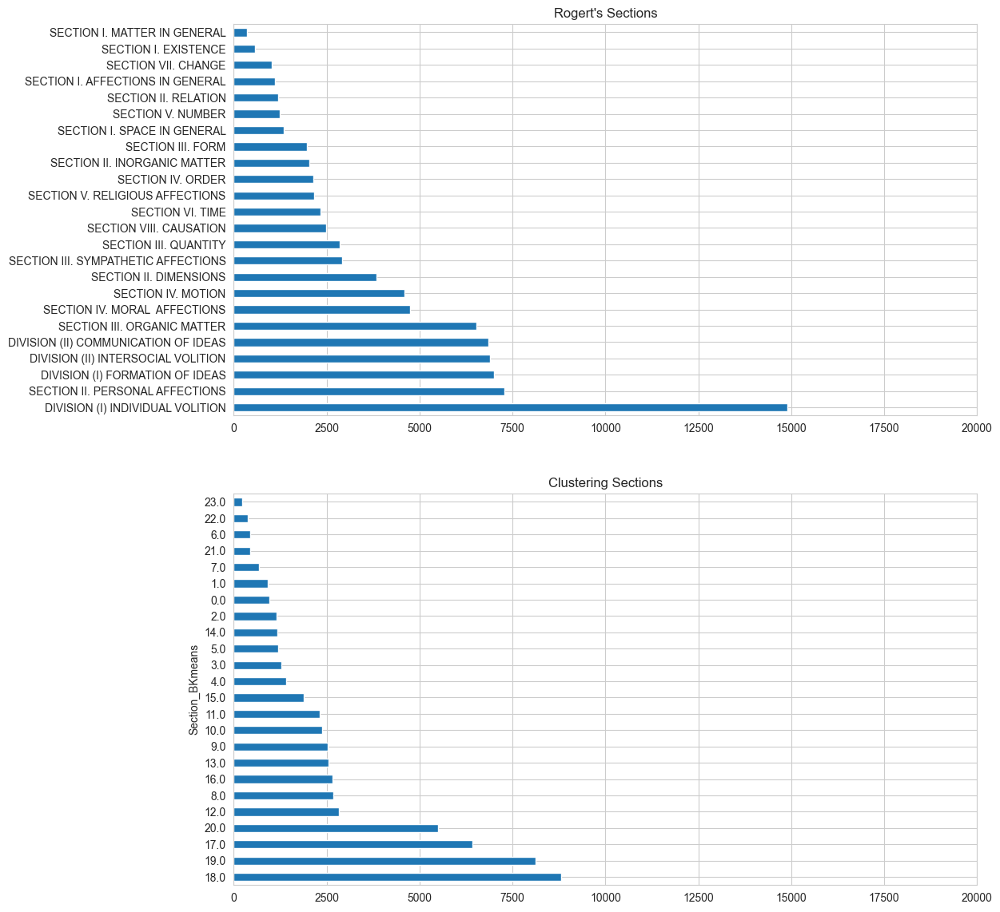

In [110]:
fig, axs = plt.subplots(2, 1, figsize=(12, 14))

rogert_words['Section'].value_counts().plot(kind='barh', ax=axs[0], title="Rogert's Sections")
axs[0].set_xlim([0, 20000])
axs[0].set_ylabel(None)

sentence_tranformer_embeddings['Section_BKmeans'].value_counts().plot(kind='barh', ax=axs[1], title="Clustering Sections")
axs[1].set_xlim([0, 20000])

plt.show()

### Universal Sentence Encoder

In [111]:
same_words_percentage(use_embeddings, 'Section_BKmeans', 'Section')

,SECTION I. EXISTENCE,SECTION II. RELATION,SECTION III. QUANTITY,SECTION IV. ORDER,SECTION V. NUMBER,SECTION VI. TIME,SECTION VII. CHANGE,SECTION VIII. CAUSATION,SECTION I. SPACE IN GENERAL,SECTION II. DIMENSIONS,SECTION III. FORM,SECTION IV. MOTION,SECTION I. MATTER IN GENERAL,SECTION II. INORGANIC MATTER,SECTION III. ORGANIC MATTER,DIVISION (I) FORMATION OF IDEAS,DIVISION (II) COMMUNICATION OF IDEAS,DIVISION (I) INDIVIDUAL VOLITION,DIVISION (II) INTERSOCIAL VOLITION,SECTION I. AFFECTIONS IN GENERAL,SECTION II. PERSONAL AFFECTIONS,SECTION III. SYMPATHETIC AFFECTIONS,SECTION IV. MORAL AFFECTIONS,SECTION V. RELIGIOUS AFFECTIONS
cluster,,,,,,,,,,,,,,,,,,,,,,,,
2.0,0.013152,0.020285,0.055729,0.041462,0.022514,0.039902,0.015827,0.035889,0.014490,0.037896,0.013598,0.026304,0.002675,0.012706,0.050825,0.081141,0.092287,0.166072,0.106108,0.005796,0.050825,0.024075,0.046144,0.024298
6.0,0.015961,0.029927,0.045666,0.035912,0.020838,0.058967,0.028153,0.033695,0.011749,0.041454,0.006429,0.056528,0.002438,0.005764,0.034804,0.144092,0.069164,0.170029,0.075815,0.008424,0.043893,0.017956,0.037686,0.004655
5.0,0.011411,0.021554,0.035320,0.023003,0.008694,0.022279,0.011411,0.031516,0.004709,0.019743,0.007064,0.024995,0.001630,0.005072,0.033146,0.169535,0.082231,0.176236,0.055606,0.020286,0.122623,0.031697,0.066655,0.013584
4.0,0.004912,0.012672,0.031238,0.020825,0.014244,0.020923,0.008153,0.026228,0.011984,0.046562,0.031631,0.046562,0.005206,0.031434,0.081827,0.067682,0.079470,0.146365,0.067092,0.013065,0.093910,0.037721,0.068173,0.032122
9.0,0.011620,0.018259,0.041024,0.041262,0.022528,0.020394,0.012331,0.027745,0.040313,0.051221,0.016362,0.040787,0.005691,0.012094,0.038179,0.059521,0.120702,0.159355,0.142993,0.004743,0.044107,0.015651,0.041024,0.012094
0.0,0.003964,0.008424,0.016105,0.016848,0.009911,0.038652,0.008424,0.019574,0.004708,0.013627,0.002725,0.015362,0.001239,0.004212,0.044351,0.139495,0.067393,0.194500,0.069623,0.016848,0.133053,0.058722,0.068880,0.043360
1.0,0.006436,0.012304,0.031043,0.025364,0.012304,0.027068,0.009086,0.034261,0.004921,0.026879,0.014764,0.027068,0.003407,0.015521,0.060572,0.098240,0.062275,0.148779,0.064736,0.022714,0.110733,0.058300,0.064357,0.058868
3.0,0.018096,0.034021,0.084329,0.042345,0.024611,0.087224,0.015925,0.028592,0.010134,0.033659,0.005067,0.037640,0.001448,0.004343,0.018096,0.104235,0.065509,0.196164,0.077814,0.006515,0.045241,0.023163,0.031849,0.003981
16.0,0.004416,0.015255,0.023685,0.031313,0.019671,0.024890,0.012445,0.026094,0.020474,0.035327,0.014452,0.071859,0.004014,0.019269,0.062224,0.056604,0.093537,0.173424,0.136491,0.008430,0.064633,0.017262,0.046969,0.017262


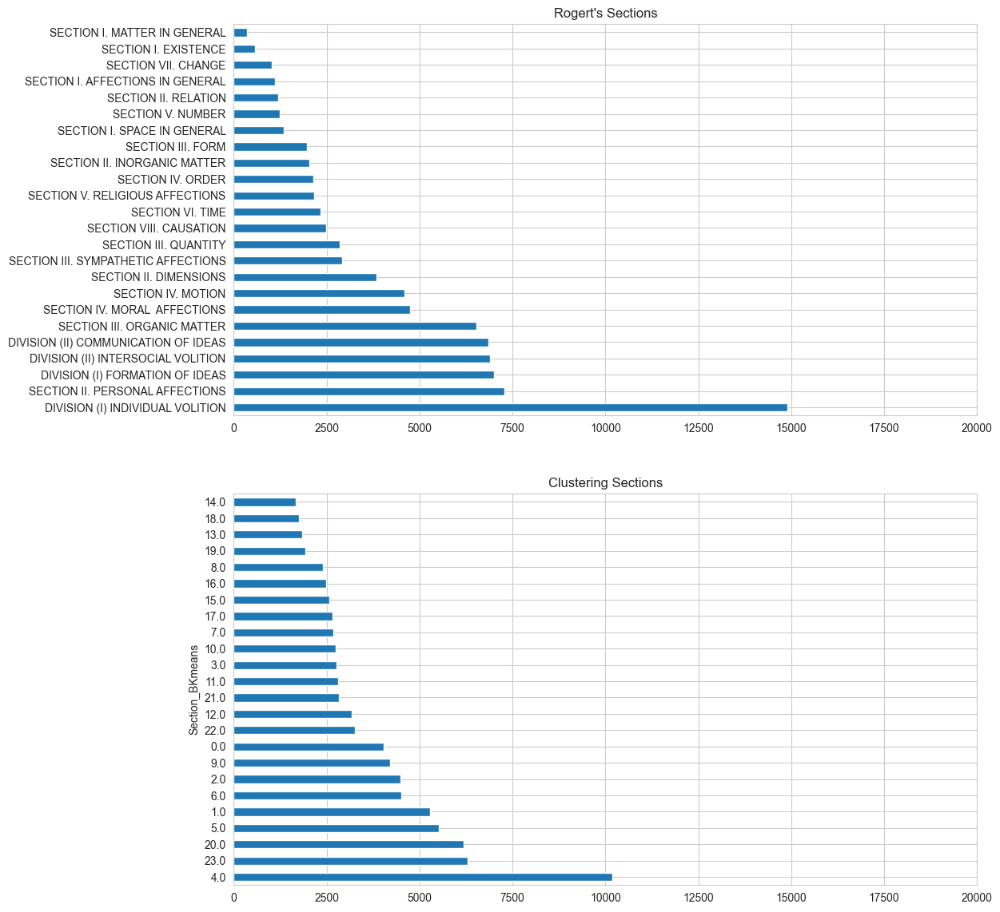

In [112]:
fig, axs = plt.subplots(2, 1, figsize=(12, 14))

rogert_words['Section'].value_counts().plot(kind='barh', ax=axs[0], title="Rogert's Sections")
axs[0].set_xlim([0, 20000])
axs[0].set_ylabel(None)

use_embeddings['Section_BKmeans'].value_counts().plot(kind='barh', ax=axs[1], title="Clustering Sections")
axs[1].set_xlim([0, 20000])

plt.show()

## Conclution

Several posibile path have been explored in order to find the optimal way to perform the classification and clustering. All the paths so far have resulted to uninidentified clusters and classes that does not match the classes and section that roget did in his work. More specific the matching between the our classes and section and roget's has the following results.

**Classes** 

all the classes we created have a result of belonging in more than one of roget's classes with a range of belonging percentage between 10-25%. The cosine similarity was actually misleading.

**Sections**

all the section we created have a result of belonging in more than one of roget's section with a range of belonging between 5-15%. The cosine similarity was not performed cause the results weren't meant to be good.

**How to improve the results**

Approaches to improve the results are the following: 
1. Different methods of clustering.
2. Standar Scale the embeddings in some situations
3. Take equal sample of each classes before clustering cause there are inbalanced
4. Use different dimensionality reduction algorithm like **t-SNE**